## Predictive Modeling for Credit Risk Assessment in Credit Card Customers



### **Introduction:**

In the contemporary financial landscape, accurately assessing the creditworthiness of individuals is paramount for financial institutions aiming to mitigate default risks and maintain fiscal health. Credit scoring models serve as essential tools in this endeavor, enabling lenders to make informed decisions by evaluating the likelihood of a borrower defaulting on their obligations. These models analyze a myriad of factors, including payment history, outstanding debts, length of credit history, types of credit in use, and recent credit inquiries, to generate a credit score that reflects an individual's credit risk.

The primary objective of this project is to develop a predictive model that accurately assesses the creditworthiness of current credit card customers. By leveraging historical account data, payment histories, enquiry records, and demographic information, the model aims to assign a 'cred score' to each customer. This score will assist Bank GoodCredit in identifying customers who may pose a higher risk of default, thereby enabling the implementation of proactive measures to mitigate potential losses.

### **Objective:**

The objective of this project is to build a predictive model that assigns a 'cred score' to current credit card customers, indicating their creditworthiness. The model will utilize the target variable Bad_label, where:

0 indicates a customer with a good credit history.

1 indicates a customer with a bad credit history, defined as falling into the 30 days past due (DPD) or more bucket.

### Data Understanding

Understanding the data is a critical step in developing an effective credit risk assessment model. The dataset comprises three primary tables: Cust_Account, Cust_Enquiry, and Cust_Demographics. Each table provides unique insights into customer behavior and characteristics, which are essential for predicting creditworthiness.

**1. Customer Account Data (Cust_Account):**

This table contains detailed records of customers' historical account activities and payment histories. Key variables include:

dt_opened: The date when the account record was created.

customer_no: A unique identifier for each customer.

upload_dt: The date when the data was uploaded into the system.

acct_type: The type of account held by the customer (e.g., savings, credit, loan).

owner_indic: Indicator of account ownership, specifying whether the account is individual or joint.

opened_dt: The date when the account was opened.

last_paymt_dt: The date of the most recent payment made on the account.

closed_dt: The date when the account was closed, if applicable.

reporting_dt: The date of the latest reporting activity for the account.

high_credit_amt: The highest credit amount ever utilized by the customer on this account.

cur_balance_amt: The current outstanding balance on the account.

amt_past_due: The amount that is past due for payment.

paymenthistory1 and paymenthistory2: Variables capturing the customer's payment behavior over time.

paymt_str_dt and paymt_end_dt: Start and end dates for the payment history period.

creditlimit: The maximum credit limit assigned to the account.

cashlimit: The cash withdrawal limit associated with the account.

rateofinterest: The interest rate applied to the account.

paymentfrequency: The frequency with which payments are scheduled (e.g., monthly, quarterly).

actualpaymentamount: The actual amount paid by the customer during the payment period.

Analyzing this table provides insights into customers' financial behavior, payment patterns, and account management practices, which are crucial for assessing credit risk.

**2. Customer Enquiry Data (Cust_Enquiry):**

This table records customers' historical credit enquiries, detailing their interest in various credit products. Key variables include:

dt_opened: The date when the enquiry record was created.

customer_no: A unique identifier for each customer.

upload_dt: The date when the enquiry data was uploaded into the system.

enquiry_dt: The date when the customer made the credit enquiry.

enq_purpose: The purpose of the enquiry, indicating the type of credit product the customer is interested in (e.g., mortgage, personal loan, credit card).

enq_amt: The amount of credit the customer is seeking.

Examining this table helps in understanding customers' credit-seeking behavior, frequency of credit enquiries, and potential credit needs, which can be indicative of their financial stability and credit risk.

**3. Customer Demographics Data (Cust_Demographics):**

This table contains demographic information for current customer applications. Key variables include:

dt_opened: The date when the demographic record was created.

customer_no: A unique identifier for each customer.

entry_time: The timestamp when the demographic data was entered into the system.

**feature_1 to feature_79: A series of anonymized demographic features, renamed and obscured to protect customer privacy. These may include variables such as age, income, employment status, residential status, etc.

Bad_label: The target variable indicating the customer's credit history status, where 0 denotes a good credit history and 1 denotes a bad credit history (falls into 30 days past due or more bucket).

Analyzing this table provides insights into the demographic factors that may influence a customer's creditworthiness.

**Data Integration and Analysis:**

Integrating data from these three tables allows for a comprehensive analysis of each customer's financial behavior, credit-seeking activities, and demographic characteristics. This holistic view is essential for building a predictive model to assess credit risk accurately.

## Import Required Libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [3]:
!pip install pymysql pandas

## Export All Tables from a MySQL Database to CSV Files

In [5]:
import pymysql
import pandas as pd

# Database connection details
host = "18.136.157.135"
port = 3306
username = "dm_team1"
password = "DM!$Team&279@20!"
database = "project_banking"

# Connect to the database
connection = pymysql.connect(
    host=host,
    user=username,
    password=password,
    database=database,
    port=port
)

try:
    # Step 1: Fetch all table names
    print("Fetching table names...")
    tables_query = "SHOW TABLES;"
    tables = pd.read_sql(tables_query, connection)
    table_names = tables.iloc[:, 0].tolist()  # Extract table names as a list
    print("Available tables:", table_names)

    # Step 2: Export data from each table
    for table_name in table_names:
        print(f"Exporting data from table: {table_name}")
        query = f"SELECT * FROM {table_name};"
        df = pd.read_sql(query, connection)
        
        # Save each table as a separate CSV file
        output_file = f"{table_name}.csv"
        df.to_csv(output_file, index=False)
        print(f"Data from table {table_name} saved to {output_file}")

    print("All tables have been exported successfully.")

except Exception as e:
    print("An error occurred:", e)

finally:
    # Close the connection
    connection.close()
    print("Database connection closed.")


Fetching table names...
Available tables: ['Cust_Account', 'Cust_Demographics', 'Cust_Enquiry']
Exporting data from table: Cust_Account
Data from table Cust_Account saved to Cust_Account.csv
Exporting data from table: Cust_Demographics
Data from table Cust_Demographics saved to Cust_Demographics.csv
Exporting data from table: Cust_Enquiry
Data from table Cust_Enquiry saved to Cust_Enquiry.csv
All tables have been exported successfully.
Database connection closed.


## Load the datasets

In [7]:
# Set the display option to show all columns in the DataFrame output
pd.set_option('display.max_columns',None)

## Overview of datasets

To get an initial understanding of the datasets (df1,df2,df3), we will display:

The first five rows (df.head())

The last five rows (df.tail())

The dataset structure and data types (df.info())

In [10]:
df1 = pd.read_csv('Cust_Account.csv')

In [11]:
df1.head()

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900.0,0,NaN,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",NaN,01-Sep-15,01-Jul-14,NaN,NaN,NaN,NaN,NaN
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,NaN,03-Oct-15,16201.0,10390,NaN,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000.0,1400.0,NaN,3.0,5603.0
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,NaN,30-Sep-15,41028.0,34420,NaN,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,NaN,NaN,NaN,NaN,NaN
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,NaN,26-Jul-07,31-Jan-09,93473.0,0,NaN,"""""""1200900600600600300000000000000000000000000...",NaN,01-Jul-07,01-Feb-06,NaN,NaN,NaN,NaN,NaN
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,NaN,31-May-15,20250.0,13500,NaN,"""""""000000000000000""""""",NaN,01-May-15,01-Jan-15,NaN,NaN,NaN,NaN,NaN


In [12]:
df1.tail()

,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
186324,11-Jun-15,1611,25-May-15,10,1,02-May-07,21-Apr-15,NaN,30-Apr-15,24228.0,24228,NaN,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Apr-15,01-May-12,NaN,NaN,NaN,NaN,NaN
186325,11-Jun-15,1611,25-May-15,10,1,11-Apr-07,22-Jun-09,02-Apr-10,30-Apr-15,19584.0,0,NaN,"""""""000179146119089058029000XXX""""""",NaN,01-Apr-10,01-Aug-09,NaN,NaN,NaN,3.0,NaN
186326,11-Jun-15,1611,25-May-15,10,1,20-Nov-06,NaN,12-Apr-12,31-Dec-13,50844.0,0,NaN,"""""""000XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",NaN,01-Apr-12,01-Dec-10,NaN,NaN,NaN,3.0,NaN
186327,11-Jun-15,1611,25-May-15,10,1,17-Oct-06,NaN,07-Mar-12,15-Apr-15,35587.0,0,NaN,"""""""000010000000000000000000000000000XXXXXXXXXX...","""""""XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",01-Mar-12,01-Apr-09,15000.0,6000.0,NaN,3.0,NaN
186328,11-Jun-15,1611,25-May-15,6,1,29-Nov-05,NaN,31-Dec-08,11-Jun-10,26000.0,0,NaN,"""""""000000000000000000000000000XXXXXXXXXXXXXXX0...",NaN,01-Dec-08,01-Oct-07,NaN,NaN,NaN,NaN,NaN


In [13]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186329 entries, 0 to 186328
Data columns (total 21 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   dt_opened            186329 non-null  object 
 1   customer_no          186329 non-null  int64  
 2   upload_dt            186329 non-null  object 
 3   acct_type            186329 non-null  int64  
 4   owner_indic          186329 non-null  int64  
 5   opened_dt            185874 non-null  object 
 6   last_paymt_dt        160842 non-null  object 
 7   closed_dt            77254 non-null   object 
 8   reporting_dt         186329 non-null  object 
 9   high_credit_amt      177454 non-null  float64
 10  cur_balance_amt      186329 non-null  int64  
 11  amt_past_due         876 non-null     float64
 12  paymenthistory1      186329 non-null  object 
 13  paymenthistory2      78505 non-null   object 
 14  paymt_str_dt         186328 non-null  object 
 15  paymt_end_dt     

In [14]:
df2 = pd.read_csv('Cust_Enquiry.csv')

In [15]:
df2.head()

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,18-Apr-15,1,21-Apr-15,19-Dec-14,2.0,3500000.0
1,18-Apr-15,1,21-Apr-15,05-Mar-14,5.0,500000.0
2,18-Apr-15,1,21-Apr-15,05-Mar-14,0.0,50000.0
3,18-Apr-15,1,21-Apr-15,22-Feb-14,10.0,50000.0
4,18-Apr-15,1,21-Apr-15,11-Jun-13,10.0,1000.0


In [16]:
df2.tail()

,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
413183,04-Dec-15,23896,09-Nov-15,22-Oct-11,5.0,200000.0
413184,04-Dec-15,23896,09-Nov-15,06-Jan-11,10.0,50000.0
413185,04-Dec-15,23896,09-Nov-15,01-Apr-10,10.0,50000.0
413186,04-Dec-15,23896,09-Nov-15,21-Feb-10,1.0,330000.0
413187,04-Dec-15,23896,09-Nov-15,17-Oct-07,2.0,682000.0


In [17]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413188 entries, 0 to 413187
Data columns (total 6 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   dt_opened    413188 non-null  object 
 1   customer_no  413188 non-null  int64  
 2   upload_dt    413078 non-null  object 
 3   enquiry_dt   413078 non-null  object 
 4   enq_purpose  413078 non-null  float64
 5   enq_amt      413078 non-null  float64
dtypes: float64(2), int64(1), object(3)
memory usage: 18.9+ MB


In [18]:
df3 = pd.read_csv('Cust_Demographics.csv')

In [19]:
df3.head()

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,01-Jun-13,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaN,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0
4,06-May-15,5,30-Apr-15,Insignia,NaN,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0


In [20]:
df3.tail()

,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
23891,31-Dec-15,23892,10-Dec-15,Platinum Deligh,10-Dec-15,704.0,1.0,Card Setup,14.0,119000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA05,MA01,NaN,NaN,1.0,CUQPSXXXXX,12-Oct-88,98715XXXXX,N,@YAHOO.COM,2.0,0.0,Graduate,New Delhi,110045.0,1988.0,10.0,Paren,Y,1.0,33000.0,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015.0,6.0,0.0,6.0,Gurgaon,122001.0,NaN,PAN Card,CUQPSXXXXX,NaN,NaN,Y,State Bank of India,99000.0,01-Jan-15,17-Jun-16,1.0,10.0,Y,N,Y,N,NaN,Y,1988-10,10.0,157.0,110045.0,0.0,1.0,33000.0,0-0,13.0,R,Y,NaN,0000-00-00,0.0,XXXXX,1.0,N,0
23892,17-Dec-15,23893,16-Nov-15,Platinum Deligh,NaN,NaN,2.0,Card Setup,14.0,35000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA03,AS33,NaN,NaN,1.0,DTPPSXXXXX,01-Feb-87,99101XXXXX,N,@GMAIL.COM,2.0,0.0,Graduate,New Delhi,110037.0,2014.0,12.0,Rente,N,1.0,1.0,Private Ltd. Co.,Others,ENGINEER,2012.0,12.0,3.0,0.0,New Delhi,110037.0,@GMAIL.COM,PAN Card,DTPPSXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,10.0,N,N,Y,N,NaN,Y,2014-12,33.0,102.0,282001.0,1.0,1.0,1.0,0-0,10.0,O,Y,NaN,0000-00-00,0.0,99101XXXXX,1.0,N,0
23893,04-Nov-15,23894,24-Sep-15,Platinum Maxima,24-Sep-15,748.0,3.0,Card Setup,14.0,68000.0,NaN,NaN,NaN,Y,PM1,NaN,NaN,CD01,D066,NaN,NaN,1.0,CPOPSXXXXX,08-Nov-86,99111XXXXX,Y,@GMAIL.COM,2.0,0.0,Graduate,New Delhi,110033.0,1986.0,0.0,Paren,Y,1.0,1.0,Private Ltd. Co.,Health Care,SENIOR ANALYST,2015.0,1.0,3.0,0.0,Gurgaon,122016.0,@ACCRETIVEHEALTH.COM,PAN Card,CPOPSXXXXX,NaN,NaN,Y,HDFC Bank,52000.0,01-Sep-14,17-Jun-16,1.0,10.0,NaN,N,Y,N,NaN,Y,1986-0,10.0,157.0,110033.0,0.0,1.0,1.0,0-0,13.0,R,NaN,NaN,0000-00-00,0.0,99111XXXXX,1.0,N,0
23894,03-Nov-15,23895,30-Sep-15,Platinum Deligh,30-Sep-15,740.0,3.0,Card Setup,14.0,158000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA40,G011,NaN,NaN,1.0,AVZPGXXXXX,24-Nov-82,93100XXXXX,N,@GMAIL.COM,1.0,0.0,Graduate,New Delhi,110095.0,2010.0,0.0,Self,Y,2.0,25000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,New Delhi,110095.0,NaN,PAN Card,AVZPGXXXXX,NaN,NaN,Y,Citibank N.A.,65000.0,01-Apr-14,17-Jun-16,2.0,10.0,NaN,N,Y,N,NaN,Y,2010-0,10.0,157.0,110095.0,0.0,2.0,25000.0,03-May,10.0,R,NaN,NaN,0000-00-00,0.0,93100XXXXX,1.0,N,0
23895,04-Dec-15,23896,06-Nov-15,Titanium Deligh,06-Nov-15,688.0,1.0,Card Setup,14.0,106000.0,NaN,NaN,NaN,Y,TD1,NaN,0.0,SA03,AS33,NaN,NaN,1.0,AJIPBXXXXX,15-Aug-83,97178XXXXX,N,@GMAIL.COM,1.0,0.0,Graduate,Ghaziabad,201005.0,2005.0,0.0,Paren,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Ghaziabad,201005.0,NaN,PAN Card,AJIPBXXXXX,NaN,NaN,Y,State Bank of India,106000.0,01-Feb-15,17-Jun-16,1.0,33.0,NaN,N,Y,N,NaN,Y,2005-0,33.0,41.0,201005.0,0.0,2.0,1.0,Aug-00,33.0,R,NaN,NaN,0000-00-00,0.0,97178XXXXX,1.0,N,0


In [21]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 83 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   dt_opened    23896 non-null  object 
 1   customer_no  23896 non-null  int64  
 2   entry_time   23881 non-null  object 
 3   feature_1    23881 non-null  object 
 4   feature_2    21060 non-null  object 
 5   feature_3    21060 non-null  float64
 6   feature_4    23881 non-null  float64
 7   feature_5    23881 non-null  object 
 8   feature_6    23881 non-null  float64
 9   feature_7    23881 non-null  float64
 10  feature_8    1261 non-null   object 
 11  feature_9    1261 non-null   object 
 12  feature_10   51 non-null     object 
 13  feature_11   23881 non-null  object 
 14  feature_12   23881 non-null  object 
 15  feature_13   10892 non-null  object 
 16  feature_14   16163 non-null  float64
 17  feature_15   23873 non-null  object 
 18  feature_16   23869 non-null  object 
 19  feat

We are focusing on df3 initially because it contains the target variable (Bad_label), which is critical for building and evaluating the predictive model. Understanding the relationship between the features in this dataset and the target variable is essential for creating an effective model.

However, there are two challenges with the features in df3:

Ambiguity in Feature Names: The feature names are labeled generically as feature_1, feature_2, and so on, making it difficult to understand their meaning or potential significance intuitively.
High Dimensionality: The dataset includes a large number of features (over 70), which can make the analysis complex and computationally expensive. Moreover, not all features are likely to contribute significantly to the model's performance.
To address these challenges, we are using correlation analysis and feature importance techniques to identify and retain the most relevant features. This approach allows us to:

Eliminate Irrelevant Features: By dropping features that have little or no relationship with the target variable, we simplify the dataset.
Improve Model Performance: Reducing dimensionality helps prevent overfitting, reduces computational costs, and improves interpretability without compromising accuracy.
This method ensures that we focus on the most impactful features, even without a clear understanding of their individual meanings.

### Data Preprocessing

### Checking missing values

In [25]:
# Increase the maximum number of columns displayed
pd.set_option('display.max_columns', None)

In [26]:
df3.isnull().sum()

dt_opened         0
customer_no       0
entry_time       15
feature_1        15
feature_2      2836
               ... 
feature_76       15
feature_77        0
feature_78       15
feature_79       15
Bad_label         0
Length: 83, dtype: int64

In [27]:
# Calculate the percentage of missing values for each column
missing_percentage = df3.isnull().mean() * 100

# Filter and display features with more than 50% missing values
features_above_threshold = missing_percentage[missing_percentage > 30]
print("Features with more than 50% missing values:")
print(features_above_threshold)

Features with more than 50% missing values:
feature_8     94.722966
feature_9     94.722966
feature_10    99.786575
feature_13    54.419150
feature_14    32.361065
feature_17    95.702210
feature_18    99.924674
feature_45    57.386173
feature_48    76.996150
feature_49    99.564781
feature_51    47.798795
feature_53    48.585537
feature_57    89.985772
feature_61    99.962337
feature_73    87.675762
feature_74    99.928858
dtype: float64


In [28]:
# Drop the features with more than 50% missing values
df3 = df3.drop(columns=features_above_threshold.index)

The variables with more than 50% missing values were removed from the dataset for the following reasons:

High Proportion of Missing Data: Features with excessive missing values (over 50%) contribute very little meaningful information to the dataset. Retaining such features could introduce noise and reduce the reliability of insights.

Improved Model Performance: Including variables with high missing values can negatively impact model accuracy and performance. Removing these features ensures the model focuses on the most informative and complete data, leading to better predictive power.

Data Quality and Efficiency: Eliminating these variables reduces data sparsity, simplifies preprocessing, and improves computational efficiency, enabling a more streamlined and robust analysis.

In [30]:
# Adjust pandas display option to show all rows
pd.set_option('display.max_rows', None)

In [31]:
df3.isnull().sum()

dt_opened         0
customer_no       0
entry_time       15
feature_1        15
feature_2      2836
feature_3      2836
feature_4        15
feature_5        15
feature_6        15
feature_7        15
feature_11       15
feature_12       15
feature_15       23
feature_16       27
feature_19       15
feature_20        0
feature_21       15
feature_22        0
feature_23       15
feature_24      640
feature_25       15
feature_26       15
feature_27     3637
feature_28       15
feature_29       15
feature_30       15
feature_31       15
feature_32       15
feature_33       15
feature_34       15
feature_35       15
feature_36     5682
feature_37     5682
feature_38     5682
feature_39       15
feature_40       15
feature_41       15
feature_42       15
feature_43       15
feature_44       15
feature_46       94
feature_47        0
feature_50       15
feature_52       15
feature_54       15
feature_55       15
feature_56       15
feature_58       15
feature_59       15
feature_60       15


In [32]:
# Handle missing values based on data type
for column in df3.columns:
    if df3[column].isnull().sum() > 0:  # Check if the column has missing values
        if df3[column].dtype == 'object':  # Categorical features
            # Fill missing values with the mode
            df3[column].fillna(df3[column].mode()[0], inplace=True)
        elif df3[column].dtype in ['float64', 'int64']:  # Numerical features
            # Fill missing values with the median
            df3[column].fillna(df3[column].median(), inplace=True)

In [33]:
# Verify all missing values are handled
print("\nMissing values after handling:")
print(df3.isnull().sum())


Missing values after handling:
dt_opened      0
customer_no    0
entry_time     0
feature_1      0
feature_2      0
feature_3      0
feature_4      0
feature_5      0
feature_6      0
feature_7      0
feature_11     0
feature_12     0
feature_15     0
feature_16     0
feature_19     0
feature_20     0
feature_21     0
feature_22     0
feature_23     0
feature_24     0
feature_25     0
feature_26     0
feature_27     0
feature_28     0
feature_29     0
feature_30     0
feature_31     0
feature_32     0
feature_33     0
feature_34     0
feature_35     0
feature_36     0
feature_37     0
feature_38     0
feature_39     0
feature_40     0
feature_41     0
feature_42     0
feature_43     0
feature_44     0
feature_46     0
feature_47     0
feature_50     0
feature_52     0
feature_54     0
feature_55     0
feature_56     0
feature_58     0
feature_59     0
feature_60     0
feature_62     0
feature_63     0
feature_64     0
feature_65     0
feature_66     0
feature_67     0
feature_68     0

### Enocding

In [35]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 67 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   dt_opened    23896 non-null  object 
 1   customer_no  23896 non-null  int64  
 2   entry_time   23896 non-null  object 
 3   feature_1    23896 non-null  object 
 4   feature_2    23896 non-null  object 
 5   feature_3    23896 non-null  float64
 6   feature_4    23896 non-null  float64
 7   feature_5    23896 non-null  object 
 8   feature_6    23896 non-null  float64
 9   feature_7    23896 non-null  float64
 10  feature_11   23896 non-null  object 
 11  feature_12   23896 non-null  object 
 12  feature_15   23896 non-null  object 
 13  feature_16   23896 non-null  object 
 14  feature_19   23896 non-null  float64
 15  feature_20   23896 non-null  object 
 16  feature_21   23896 non-null  object 
 17  feature_22   23896 non-null  object 
 18  feature_23   23896 non-null  object 
 19  feat

In [36]:
# Filter columns with dtype 'object'
object_columns = df3.select_dtypes(include=['object'])

# Count unique values for each object column
unique_values = object_columns.nunique()

# Display the results
print("Categorical Features and Their Unique Value Counts:")
print(unique_values)


Categorical Features and Their Unique Value Counts:
dt_opened       197
entry_time      296
feature_1         7
feature_2       281
feature_5         1
feature_11        2
feature_12       16
feature_15      364
feature_16      522
feature_20    10610
feature_21     8462
feature_22     3251
feature_23        2
feature_24      721
feature_27       10
feature_28       62
feature_32        5
feature_33        2
feature_36        9
feature_37       11
feature_38     5663
feature_43       70
feature_46        5
feature_47    11250
feature_50        2
feature_54        1
feature_58        2
feature_59        2
feature_60        2
feature_62        2
feature_63      491
feature_70      133
feature_72        2
feature_75       62
feature_77     3124
feature_79        2
dtype: int64


#### Droping Irrelevant Variables

Remove variables with too many unique values or a single unique value.

In [39]:
drop_columns = ['feature_5', 'feature_54','feature_6','feature_20', 'feature_21', 'feature_47']
df3.drop(columns=drop_columns, inplace=True)

#### Encoding remaining variables

#### dt_opened

In [42]:
# Convert 'dt_opened' column to datetime format
df3['dt_opened'] = pd.to_datetime(df3['dt_opened'], format='%d-%b-%y')

In [43]:
# Extracting year, month and day
df3['dt_opened_year'] = df3['dt_opened'].dt.year
df3['dt_opened_month'] = df3['dt_opened'].dt.month
df3['dt_opened_day'] = df3['dt_opened'].dt.day

In [44]:
# Verify the extracted columns
print(df3[['dt_opened', 'dt_opened_year', 'dt_opened_month', 'dt_opened_day']].head())

   dt_opened  dt_opened_year  dt_opened_month  dt_opened_day
0 2015-04-18            2015                4             18
1 2015-04-21            2015                4             21
2 2015-04-22            2015                4             22
3 2015-04-25            2015                4             25
4 2015-05-06            2015                5              6


df3['year'].nunique

In [46]:
df3.drop(columns=['dt_opened','dt_opened_year'],inplace=True)

The dt_opened column is dropped as it contains redundant information, and the dt_opened_year column is removed since it has only a single unique value, offering no additional variation for analysis.

#### entry_time

In [49]:
# Convert 'entry_time' column to datetime format
df3['entry_time'] = pd.to_datetime(df3['entry_time'], format='%d-%b-%y')
# Extracting year, month, and day
df3['entry_time_year'] = df3['entry_time'].dt.year
df3['entry_time_month'] = df3['entry_time'].dt.month
df3['entry_time_day'] = df3['entry_time'].dt.day

In [50]:
df3['entry_time_year'].nunique()

1

In [51]:
df3.drop(columns=['entry_time','entry_time_year'],inplace=True)

The entry_time column is dropped as it contains redundant information, and the entry_time_year column is removed since it has only a single unique value, offering no additional variation for analysis.

#### feature_1

In [54]:
df3['feature_1'].unique()

array(['Insignia', 'Platinum Deligh', 'Platinum Maxima', 'Golf Card',
       'Titanium Deligh', 'Platinum Cricke', 'RBL Bank Fun+'],
      dtype=object)

In [55]:
df3['feature_1'] = df3.feature_1.map({'Insignia':0, 'Platinum Deligh':1, 'Platinum Maxima':2, 'Golf Card':3,
       'Titanium Deligh':4, 'Platinum Cricke':5, 'RBL Bank Fun+':6})

#### feature_2

In [57]:
df3['feature_2'].unique()

array(['13-Apr-15', '21-Apr-15', '20-Apr-15', '19-Oct-15', '06-May-15',
       '15-May-15', '27-May-15', '28-May-15', '02-Jun-15', '23-May-15',
       '17-Jun-15', '26-Jun-15', '30-Jun-15', '02-Jul-15', '20-Jul-15',
       '25-Jul-15', '29-Jul-15', '31-Jul-15', '23-Jul-15', '07-Aug-15',
       '17-Aug-15', '26-Aug-15', '25-Aug-15', '21-Aug-15', '27-Aug-15',
       '01-Sep-15', '08-Sep-15', '14-Sep-15', '16-Sep-15', '24-Sep-15',
       '20-Aug-15', '21-Sep-15', '25-Sep-15', '12-Mar-15', '21-Oct-15',
       '22-May-15', '10-Dec-15', '03-Dec-15', '05-Nov-15', '17-Oct-15',
       '14-Oct-15', '12-Oct-15', '09-Oct-15', '13-Oct-15', '16-Oct-15',
       '26-Oct-15', '07-Nov-15', '05-Oct-15', '06-Nov-15', '12-Nov-15',
       '19-Nov-15', '12-Dec-15', '08-Oct-15', '15-Apr-15', '14-Apr-15',
       '16-Apr-15', '17-Apr-15', '12-Apr-15', '18-Apr-15', '22-Apr-15',
       '23-Apr-15', '19-Apr-15', '25-Apr-15', '24-Apr-15', '28-Apr-15',
       '26-Apr-15', '30-Apr-15', '29-Apr-15', '27-Apr-15', '02-M

Since the variable feature_2 contains a series of dates with no context about their significance or relevance to the analysis, and encoding it without understanding its meaning may introduce noise into the dataset, it is appropriate to drop this variable.

In [59]:
df3.drop(columns='feature_2',inplace=True)

#### feature_11

In [61]:
df3['feature_11'].unique()

array(['Y', 'N'], dtype=object)

In [62]:
# One-Hot encoding
df3.feature_11=pd.get_dummies(df3.feature_11,drop_first=True).astype(int)

#### feature_12

In [64]:
df3['feature_12'].unique()

array(['IS1', 'IS2', 'PD1', 'PM1', 'GO1', 'TD1', 'TD2', 'PM2', 'DD1',
       'DD2', 'PM3', 'PM4', 'PD2', 'PD3', 'PB1', 'PB2'], dtype=object)

In [65]:
df3['feature_12'] = df3.feature_12.map({'IS1':0, 'IS2':1, 'PD1':2, 'PM1':3, 'GO1':4, 'TD1':5, 'TD2':6, 'PM2':7, 'DD1':8,
       'DD2':9, 'PM3':10, 'PM4':11, 'PD2':12, 'PD3':13, 'PB1':14, 'PB2':15})

#### feature_15

In [67]:
df3['feature_15'].unique()

array(['159', '91', '157', '100', '88', '141', '20', '4611', '155', '180',
       '113', '4254', '143', 'IB03', '116', '142', 'DD01', '5625', 'W01',
       '4881', '184', '161', '4266', '112', '4637', '92', 'SA31', 'MA21',
       'RNG', 'IB04', '5611', 'CS01', 'OXFD', '70', 'SA03', 'CD01',
       'HA06', 'SA01', 'HARI', 'SARE', 'SA32', 'BB0L', 'DP14', 'D001',
       'MA02', 'DM02', 'DA06', '158', 'MA03', 'HA07', 'SA05', 'PBOL',
       'IM01', 'HA08', 'SA14', 'SA02', 'HAR1', 'IB02', 'SA06', 'SA33',
       'SA30', 'MA01', 'SAR1', 'HA03', 'SA07', 'DA30', 'BBOL', 'BA05',
       'DP02', '10', 'sa03', 'ha07', '53', '148', 'FRC1', 'IB05', '95',
       'HA05', '87', 'WT01', 'DS08', 'SA25', 'WO1', '1', 'SA22', 'DH03',
       '96', 'IB06', 'SA34', '83', 'IBOL', 'MA08', 'GA01', 'M002', '62',
       'MA14', 'D114', 'SA29', 'CH07', 'W02', 'IS01', 'AC01', 'AC02',
       'RPOL', 'SA23', 'MD02', 'SA35', 'MA18', 'BHOL', 'ISK', '6289',
       'PA05', '4110', '89', 'MA20', 'PA01', 'MA19', 'HA09', '6380',

In [68]:
# Ensure the encoding is done correctly
freq_encoding_1 = df3['feature_15'].value_counts().astype(int).to_dict()

# Apply the frequency encoding
df3['feature_15'] = df3['feature_15'].map(freq_encoding_1)

In [69]:
print(df3['feature_15'].dtype)

int64


#### feature_16

In [71]:
df3['feature_16'].unique()

array(['4284', 'B001', '5107', 'D016', '5231', '5957', '5785', 'D068',
       '3140', 'K001', 'D011', '4296', '6745', '4527', '4714', 'D043',
       'AS19', 'D041', 'D100', 'D006', '4247', '4268', 'N002', '5509',
       '4462', '6024', '6603', '6041', 'D073', '5055', 'M031', '4282',
       'M037', '4251', '4767', 'P007', 'V001', 'M019', 'RN01', 'D077',
       'B021', 'B023', 'G049', 'C021', 'SRC1', 'RN06', '6480', 'RNG',
       'D135', 'AS11', 'SZ02', 'H006', 'G008', '5203', 'D095', 'D067',
       'RK01', 'D094', 'B006', 'P005', '4555', 'IN01', 'AS03', 'M001',
       'A001', 'G007', '6362', 'SI01', 'M032', '5495', 'MA03', 'D109',
       'V003', 'D091', 'MA02', 'M016', 'D023', '5552', 'AS06', 'D036',
       '6430', 'D110', 'D031', 'RK02', 'VRP2', 'D054', 'ST02', 'D114',
       'AS09', 'AS01', 'D102', 'D064', 'ST01', 'D112', 'D101', '5532',
       '5852', 'P006', 'S203', 'HA01', 'A012', 'VA01', 'VRP1', 'VA03',
       'IC01', 'G009', 'C010', 'SZ03', 'A311', 'SFA2', 'D019', 'K004',
       

In [72]:
freq_encoding_2 = df3['feature_16'].value_counts().astype(int).to_dict()
df3['feature_16'] = df3['feature_16'].map(freq_encoding_2)

#### feature_22

In [74]:
df3['feature_22'].unique()

array(['98332XXXXX', '99455XXXXX', '98456XXXXX', ..., '80997XXXXX',
       '99517XXXXX', '99969XXXXX'], dtype=object)

Dropping feature_22 since it contains phone numbers, which are irrelevant for analysis or predictive modeling, provide no analytical value, and may raise privacy concerns.

In [76]:
df3.drop('feature_22', axis=1, inplace=True)

#### feature_23

In [78]:
df3['feature_23'].unique()

array(['N', 'Y'], dtype=object)

In [79]:
df3.feature_23=pd.get_dummies(df3.feature_23,drop_first=True).astype(int)

#### feature_24

In [81]:
df3['feature_24'].unique()

array(['@REDIFFMAIL.COM', '@GMAIL.COM', '@SHOBANARAYAN.COM', '@VSNL.COM',
       '@VSNL.NET', '@PRUDENTBROKERS.COM', '@BILTECHINDIA.COM',
       '@GO2UFM.COM', '@YAHOO.COM', '@THINKIDEALAB.COM', '@DELOITTE.COM',
       '@YAHOO.CO.UK', '@RATNAKARBANK.IN', '@RBLBANK.COM',
       '@AZUREHOSPITALITY.COM', '@LEXINGTONSOFT.COM', '@BAJAJNGP.COM',
       '@MEDANTA.ORG', '@KRISHOVERSEAS.COM', '@HOTMAIL.COM',
       '@ABIABI.ORG', '@VIMCO.IN', '@OLIVERWYMAN.COM',
       '@HILLEMANLABS.ORG', '@LIVE.COM', '@INDIAN_DESIGNS.COM',
       '@gmail.com', '@CDCGROUP.COM', '@METCOINDIA.COM',
       '@SKPMONEYWISE.COM', '@YAHOO.CO.IN', '@CRAYON.COM',
       '@DIMENSIONPROJECTS.COM', '@ACROSWORLD.COM', '@ADVANIOTC.COM',
       '@CHIRAGDEEP.COM', '@life.in', '@AXISBANK.COM', '@YMAIL.COM',
       '@YAHOO.IN', '@yahoo.co.in', '@EXPLOREAKC.COM', '@FLYKING.CO.IN',
       '@yahoo.com', '@KAIZNHR.COM', '@rediffmail.com', '@LIFE.COM',
       '@LIVE.IN', '@liVE.COM', '@KOTAK.COM', '@yahoo.in', '@GAMIL.COM',
       '

Dropping feature_24 (email) since it represents email addresses, which are of no use for the predictive model and do not provide meaningful information for analysis.

In [83]:
df3.drop('feature_24',axis=1,inplace=True)

#### feature_27

In [85]:
df3['feature_27'].unique()

array(['Graduate', 'CA', 'Post-Graduate', 'Professional', 'MBA/MMS',
       'Diploma', 'Others', 'Doctor', 'Engineer', 'Architect'],
      dtype=object)

In [86]:
df3['feature_27'] = df3.feature_27.map({'Graduate':0, 'CA':1, 'Post-Graduate':2, 'Professional':3, 'MBA/MMS':4,
       'Diploma':5, 'Others':6, 'Doctor':7, 'Engineer':8, 'Architect':9})

#### feature_28

In [88]:
df3['feature_28'].unique()

array(['Mumbai / Navi Mumbai / Thane', 'Bengaluru', 'Pune', 'Gurgaon',
       'New Delhi', 'Kolhapur', 'Noida / Greater Noida', 'Chennai',
       'Kolkata / Howrah', 'Vadodara', 'Nagpur',
       'Hyderabad / Secunderabad', 'Lucknow', 'Ghaziabad', 'Ahmedabad',
       'Faridabad', 'Ankleshwar', 'Rangareddy', 'Udaipur', 'Kanchipuram',
       'Surat', 'Gandhinagar', 'Belgaum', 'Medak', 'Gautam Buddha Nagar',
       'Agra', 'Tiruvallur', 'Kota', 'Panipat', 'Bhopal', 'Davangere',
       'Kurnool', 'Satara', 'Krishna', 'Jind', 'Sagar', 'Coimbatore',
       'Guntur', 'Kheda', 'Sindhudurg', 'Jhajjar', 'Chittaurgarh',
       'Valsad', 'Solapur', 'Sangli', 'Hooghly', 'Chittoor', 'Moradabad',
       'Dadra and Nagar Haveli', 'Thanjavur', 'Virudhunagar', 'Warangal',
       'Bankura', '24 Parganas', 'Rewari', 'Bahadurgarh', 'Banaskantha',
       'Tiruchirapalli', 'Anand', 'Navsari', 'Bhavnagar', 'Indore'],
      dtype=object)

In [89]:
# Calculate the frequency of each city in feature_28
freq_encoding_28 = df3['feature_28'].value_counts().astype(int).to_dict()

# Map the frequency encoding to the feature_28 column
df3['feature_28'] = df3['feature_28'].map(freq_encoding_28)

#### feature_32

In [91]:
df3['feature_32'].unique()

array(['Self', 'Paren', 'Compa', 'Rente', 'PG/Ho'], dtype=object)

In [92]:
df3['feature_32'] = df3.feature_32.map({'Self':0, 'Paren':1, 'Compa':2, 'Rente':3, 'PG/Ho':4})

#### feature_33

In [94]:
df3['feature_33'].unique()

array(['Y', 'N'], dtype=object)

In [95]:
df3.feature_33=pd.get_dummies(df3.feature_33,drop_first=True).astype(int)

#### feature_36

In [97]:
df3['feature_36'].unique()

array(['Private Ltd. Co.', 'Government Organisation', 'Public Ltd Co.',
       'Proprietorship', 'MNC', 'Partnership', 'PSU', 'Partnership Co.',
       'Others'], dtype=object)

In [98]:
df3['feature_36'] = df3.feature_36.map({'Private Ltd. Co.':0, 'Government Organisation':1, 'Public Ltd Co.':2,
       'Proprietorship':3, 'MNC':4, 'Partnership':5, 'PSU':6, 'Partnership Co.':7,'Others':8})

#### feature_37

In [100]:
df3['feature_37'].unique()

array(['Banking/Financial Services', 'Others', 'Information Technology',
       'Manufacturing', 'KPO/LPO/ITES', 'Industrial', 'Health Care',
       'Real Estate', 'Transportation/Logistics', 'Tourism',
       'Agriculture'], dtype=object)

In [101]:
df3['feature_37'] = df3.feature_37.map({'Banking/Financial Services':0, 'Others':1, 'Information Technology':2,
       'Manufacturing':3, 'KPO/LPO/ITES':4, 'Industrial':5, 'Health Care':6,'Real Estate':7,
        'Transportation/Logistics':8,'Tourism':9,'Agriculture':10})

#### feature_38

In [103]:
df3['feature_38'].unique()

array(['MANAGER', 'ADMIN OFFICER', 'CHAIRPERSON', ..., 'TECH SALES',
       'SR OPERATION PROF', 'SERVICE ASSOCIATE'], dtype=object)

In [104]:
# Calculate the frequency of each unique value in feature_33
freq_encoding_38= df3['feature_38'].value_counts().to_dict()

# Map the frequency encoding to the feature_33 column
df3['feature_38'] = df3['feature_38'].map(freq_encoding_38)

#### feature_43

In [106]:
df3['feature_43'].nunique()

70

In [107]:
freq_encoding_43 = df3['feature_43'].value_counts().to_dict()
df3['feature_43'] = df3['feature_43'].map(freq_encoding_43)

#### feature_46

In [109]:
df3['feature_46'].unique()

array(['PAN Card', 'Aadhar Card', 'Passport', 'Driving License',
       'Voter ID'], dtype=object)

In [110]:
df3['feature_46'] = df3.feature_46.map({'PAN Card':0, 'Aadhar Card':1, 'Passport':2, 'Driving License':3,
       'Voter ID':4})

#### feature_50

In [112]:
df3['feature_50'].unique()

array(['Y', 'N'], dtype=object)

In [113]:
df3.feature_50=pd.get_dummies(df3.feature_50,drop_first=True).astype(int)

#### feature_58

In [115]:
df3['feature_58'].unique()

array(['Y', 'N'], dtype=object)

In [116]:
df3.feature_58=pd.get_dummies(df3.feature_58,drop_first=True).astype(int)

#### feature_59

In [118]:
df3['feature_59'].unique()

array(['Y', 'N'], dtype=object)

In [119]:
df3.feature_59=pd.get_dummies(df3.feature_59,drop_first=True).astype(int)

#### feature_60

In [121]:
df3['feature_60'].unique()

array(['N', 'Y'], dtype=object)

In [122]:
df3.feature_60=pd.get_dummies(df3.feature_60,drop_first=True).astype(int)

#### feature_62

In [124]:
df3['feature_62'].unique()

array(['Y', 'N'], dtype=object)

In [125]:
df3.feature_62=pd.get_dummies(df3.feature_62,drop_first=True).astype(int)

#### feature_63

In [127]:
df3['feature_63'].nunique()

491

In [128]:
freq_encoding_63 = df3['feature_63'].value_counts().to_dict()
df3['feature_63'] = df3['feature_63'].map(freq_encoding_63)

#### feature_70

In [130]:
df3['feature_70'].unique()

array(['Nov-00', '0-0', 'Apr-00', 'May-00', 'Jul-00', '05-Mar', 'Feb-00',
       '02-Jul', '0-6', '01-Oct', 'Oct-00', 'Sep-00', 'Jan-00', '06-Jun',
       'Aug-00', '02-May', '01-Apr', '01-Jun', '09-Sep', '03-Jan',
       '08-Jul', '06-Jul', '11-Jan', 'Jun-00', '02-Oct', '09-Apr',
       'Mar-00', '09-Jun', '03-May', '11-Apr', '07-Jul', '02-Feb',
       '03-Mar', '01-Mar', '04-Feb', '11-Jun', '03-Oct', '01-Sep',
       '11-Sep', '02-Mar', '04-Apr', '06-May', '02-Jun', '07-Feb',
       '06-Oct', '11-Oct', '04-May', '09-Aug', '11-May', '05-Jan',
       '03-Feb', '04-Jul', '05-Aug', '08-Jun', '03-Jul', '11-Jul',
       '10-Sep', '04-Sep', '08-Jan', '03-Apr', '07-Mar', '04-Jan',
       '06-Jan', '0-5', '02-Aug', '01-May', '03-Jun', '01-Jan', '10-Aug',
       '02-Apr', '11-Mar', '03-Aug', '04-Mar', '05-Jun', '05-Oct',
       '05-Jul', '04-Aug', '0-7', '01-Aug', '07-May', '0-3', '05-Apr',
       '06-Mar', '08-Apr', '01-Jul', '11-Aug', '04-Oct', '06-Apr', '0-8',
       '06-Feb', '06-Aug', '09

Dropping feature_70 since it has high cardinality with 70 unique values, and the meaning of these values is unclear. Retaining this feature may introduce noise or unnecessary complexity to the model without adding significant value.

In [132]:
df3.drop('feature_70', axis=1, inplace=True)

#### feature_72

In [134]:
df3['feature_72'].unique()

array(['R', 'O'], dtype=object)

In [135]:
df3.feature_72=pd.get_dummies(df3.feature_72,drop_first=True).astype(int)

#### feature_75

In [137]:
df3['feature_75'].unique()

array(['0000-00-00', '6/15/65', '10/27/63', '09-01-1960', '10/16/71',
       '1/15/96', '10/26/84', '05-11-1984', '04-01-1954', '07-06-1970',
       '09-08-1940', '09-05-1982', '5/15/89', '1/17/91', '05-12-1991',
       '1/29/86', '12/18/90', '7/23/71', '3/25/87', '8/14/82', '7/19/62',
       '2/27/83', '10/17/95', '2/13/70', '9/29/69', '08-01-1990',
       '11-08-1968', '11-04-1985', '06-03-1978', '12/15/85', '7/14/81',
       '04-09-1972', '5/17/71', '7/25/84', '6/23/58', '12-08-1979',
       '12-12-1982', '10/28/78', '2/23/78', '2/17/83', '9/29/93',
       '11/23/89', '6/29/85', '04-01-1990', '11-08-1976', '01-10-1982',
       '12-09-1983', '04-10-1995', '12-10-1984', '07-10-1975', '12/22/85',
       '9/23/86', '3/14/86', '10/27/87', '3/14/84', '03-05-1996',
       '12/22/75', '6/21/82', '03-04-1990', '12-11-1984', '5/24/78',
       '1/25/62'], dtype=object)

In [138]:
correlation = df3.groupby('feature_75')['Bad_label'].mean()
print(correlation)

feature_75
0000-00-00    0.041955
01-10-1982    1.000000
03-04-1990    0.000000
03-05-1996    0.000000
04-01-1954    0.000000
04-01-1990    0.000000
04-09-1972    0.000000
04-10-1995    0.000000
05-11-1984    0.000000
05-12-1991    0.000000
06-03-1978    0.000000
07-06-1970    0.000000
07-10-1975    0.000000
08-01-1990    0.000000
09-01-1960    0.000000
09-05-1982    1.000000
09-08-1940    0.000000
1/15/96       0.000000
1/17/91       0.000000
1/25/62       0.000000
1/29/86       0.000000
10/16/71      1.000000
10/17/95      0.000000
10/26/84      0.000000
10/27/63      0.000000
10/27/87      0.000000
10/28/78      0.000000
11-04-1985    0.000000
11-08-1968    0.000000
11-08-1976    0.000000
11/23/89      0.000000
12-08-1979    0.000000
12-09-1983    0.000000
12-10-1984    0.000000
12-11-1984    0.000000
12-12-1982    0.000000
12/15/85      0.000000
12/18/90      0.000000
12/22/75      0.000000
12/22/85      0.000000
2/13/70       1.000000
2/17/83       0.000000
2/23/78       0.000000


Dropping feature_75 since it consists of 62 unique values, and we don't have clear information on what these dates represent. Without proper understanding of the feature's context, it's difficult to interpret its relevance to the target variable. Additionally, the presence of numerous unique values might not add meaningful insights, and it could introduce unnecessary complexity to the model. Therefore, it's better to drop this variable.

In [140]:
df3.drop(columns='feature_75',inplace=True)

#### feature_77

In [142]:
df3['feature_77'].unique()

array(['98332XXXXX', '99455XXXXX', '98456XXXXX', ..., '80997XXXXX',
       '99517XXXXX', '99969XXXXX'], dtype=object)

Dropping feature_77 since it represents the person's mobile number, which is personally identifiable information (PII) and unlikely to provide meaningful insights for prediction. Additionally, this variable may not have any direct relevance to the model's performance, and retaining such information could raise privacy concerns. Therefore, it's better to drop this feature.

In [144]:
df3.drop('feature_77',axis=1,inplace=True)

#### feature_79

In [146]:
df3['feature_79'].unique()

array(['N', 'Y'], dtype=object)

In [147]:
df3.feature_79=pd.get_dummies(df3.feature_79,drop_first=True).astype(int)

### Scaling

In [149]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
d1=['Bad_label']
df3_1=sc.fit_transform(df3.drop(d1,axis=1))

In [150]:
df3_1

array([[-1.73197833, -1.78232201, -2.08244104, ...,  0.1473283 ,
        -1.81890752, -0.31827761],
       [-1.73183336, -1.78232201,  1.05674891, ...,  0.47631132,
        -1.81890752,  0.60342712],
       [-1.73168839, -1.78232201,  1.45628218, ...,  0.58597233,
        -1.81890752,  0.60342712],
       ...,
       [ 1.73168839, -0.14369528,  0.71429183, ..., -1.38792582,
         0.362394  ,  0.9490664 ],
       [ 1.73183336, -0.96300864,  0.4859871 , ..., -1.49758683,
         0.362394  ,  1.64034495],
       [ 1.73197833,  1.49493146, -0.9979936 , ..., -1.38792582,
         1.23491461, -1.12476926]])

### Correlation Analysis

This step helps identify features that have a strong linear relationship with the target variable (Bad_label).

In [153]:
# Compute correlation with the target variable
correlation = df3.corr()['Bad_label'].sort_values(ascending=False)

In [154]:
df3.head()

,customer_no,feature_1,feature_3,feature_4,feature_7,feature_11,feature_12,feature_15,feature_16,feature_19,feature_23,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_46,feature_50,feature_52,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_71,feature_72,feature_76,feature_78,feature_79,Bad_label,dt_opened_month,dt_opened_day,entry_time_month,entry_time_day
0,1,0,650.0,2.0,500000.0,1,0,25,1,1.0,0,1.0,2.0,0,1708,400610.0,1965.0,0.0,0,1,2.0,90000.0,0,0,7306,0.0,0.0,0.0,0.0,1314,400059.0,0,1,0.0,1.0,21.0,1,1,0,1,27,21.0,15.0,400610.0,0.0,2.0,90000.0,21.0,1,0.0,1.0,0,0,4,18,4,13
1,2,0,760.0,1.0,1200000.0,1,0,2,4,1.0,0,1.0,2.0,0,539,560042.0,1969.0,0.0,0,1,2.0,1.0,0,0,7306,0.0,0.0,0.0,0.0,533,560042.0,0,0,0.0,1.0,17.0,1,1,0,1,44,17.0,12.0,560042.0,0.0,2.0,1.0,17.0,1,0.0,1.0,0,0,4,21,4,21
2,3,0,774.0,1.0,700000.0,1,0,2,4,2.0,0,1.0,0.0,0,539,560042.0,1966.0,0.0,0,1,2.0,1.0,0,0,7306,0.0,0.0,0.0,0.0,533,560042.0,0,0,0.0,3.0,17.0,0,1,0,1,20,17.0,12.0,560042.0,0.0,2.0,1.0,17.0,1,0.0,1.0,0,0,4,22,4,21
3,4,0,770.0,1.0,500000.0,1,0,6,1,1.0,0,1.0,3.0,0,280,411001.0,1988.0,0.0,0,1,2.0,100000.0,0,0,7306,0.0,0.0,0.0,0.0,280,411026.0,0,1,0.0,1.0,21.0,1,1,0,1,319,21.0,16.0,411001.0,0.0,2.0,100000.0,21.0,1,1.0,1.0,0,0,4,25,4,15
4,5,0,721.0,3.0,500000.0,1,0,24,32,1.0,0,1.0,3.0,0,1405,122009.0,1995.0,0.0,0,1,2.0,300000.0,0,0,7306,0.0,0.0,0.0,0.0,3555,122009.0,0,0,0.0,1.0,13.0,1,1,0,1,732,13.0,3.0,122009.0,0.0,2.0,300000.0,13.0,1,0.0,1.0,0,0,5,6,4,30


In [155]:
correlation

Bad_label           1.000000
feature_25          0.021835
dt_opened_month     0.019430
feature_23          0.018999
feature_4           0.017219
feature_34          0.016178
feature_68          0.016178
feature_28          0.012618
entry_time_month    0.010192
feature_71          0.009461
feature_72          0.007988
feature_30          0.006487
feature_55          0.006441
feature_63          0.006206
feature_43          0.005918
feature_38          0.005466
feature_65          0.005319
feature_19          0.005220
feature_32          0.004532
feature_67          0.003770
feature_64          0.003531
feature_62          0.003030
feature_37          0.001926
entry_time_day      0.001885
feature_16          0.001470
feature_56          0.001342
feature_76          0.000333
feature_36         -0.001370
customer_no        -0.001673
feature_42         -0.002614
feature_27         -0.002886
feature_79         -0.003030
feature_33         -0.003770
feature_40         -0.004764
feature_78    

#### Train a Random Forest model and determine feature importance  

In [156]:
from sklearn.ensemble import RandomForestClassifier

X = df3.drop(columns=['Bad_label'])
y = df3['Bad_label']

model = RandomForestClassifier(random_state=42)
model.fit(X, y)

# Get feature importance
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)
print(feature_importance_df)

             Feature  Importance
4          feature_7    0.053177
0        customer_no    0.052921
2          feature_3    0.051064
43        feature_66    0.047663
55    entry_time_day    0.045706
53     dt_opened_day    0.044003
15        feature_29    0.042004
30        feature_44    0.041773
16        feature_30    0.040931
40        feature_63    0.040538
8         feature_16    0.040234
21        feature_35    0.030188
46        feature_69    0.030167
7         feature_15    0.027074
24        feature_38    0.026564
25        feature_39    0.025287
54  entry_time_month    0.023888
42        feature_65    0.023607
26        feature_40    0.022615
27        feature_41    0.021884
33        feature_52    0.021750
52   dt_opened_month    0.021577
29        feature_43    0.014891
22        feature_36    0.013901
41        feature_64    0.013306
23        feature_37    0.012720
12        feature_26    0.012569
18        feature_32    0.012154
13        feature_27    0.011451
14        

##### Recursive Feature Selection (RFE) with a Random Forest model

 We use Recursive Feature Elimination (RFE) with Random Forest to identify the most relevant features,  
reducing dimensionality while preserving predictive power. This helps improve model efficiency,  
reduce overfitting, and enhance interpretability by selecting only the top 10 most important features.

In [158]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier
model = RandomForestClassifier(n_estimators=100)

# Initialize RFE with RandomForest model
rfe = RFE(estimator=model, n_features_to_select=10)  # Number of features to keep

# Fit RFE on the training data
rfe.fit(X_train, y_train)

# Get selected and dropped features
selected_features = X_train.columns[rfe.support_]
dropped_features = X_train.columns[~rfe.support_]

print("Selected features:", selected_features)
print("Dropped features:", dropped_features)

# Build model with selected features
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

model.fit(X_train_selected, y_train)

# Make predictions
y_pred = model.predict(X_test_selected)

# Evaluate model
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy:.4f}")

Selected features: Index(['customer_no', 'feature_3', 'feature_7', 'feature_16', 'feature_29',
       'feature_44', 'feature_63', 'feature_66', 'dt_opened_day',
       'entry_time_day'],
      dtype='object')
Dropped features: Index(['feature_1', 'feature_4', 'feature_11', 'feature_12', 'feature_15',
       'feature_19', 'feature_23', 'feature_25', 'feature_26', 'feature_27',
       'feature_28', 'feature_30', 'feature_31', 'feature_32', 'feature_33',
       'feature_34', 'feature_35', 'feature_36', 'feature_37', 'feature_38',
       'feature_39', 'feature_40', 'feature_41', 'feature_42', 'feature_43',
       'feature_46', 'feature_50', 'feature_52', 'feature_55', 'feature_56',
       'feature_58', 'feature_59', 'feature_60', 'feature_62', 'feature_64',
       'feature_65', 'feature_67', 'feature_68', 'feature_69', 'feature_71',
       'feature_72', 'feature_76', 'feature_78', 'feature_79',
       'dt_opened_month', 'entry_time_month'],
      dtype='object')
Model Accuracy: 0.9588


In [159]:
train_accuracy = model.score(X_train_selected, y_train)
test_accuracy = model.score(X_test_selected, y_test)
print(f"Training Accuracy: {train_accuracy:.4f}")
print(f"Testing Accuracy: {test_accuracy:.4f}")

Training Accuracy: 0.9998
Testing Accuracy: 0.9588


In [160]:
selected_features

Index(['customer_no', 'feature_3', 'feature_7', 'feature_16', 'feature_29',
       'feature_44', 'feature_63', 'feature_66', 'dt_opened_day',
       'entry_time_day'],
      dtype='object')

In [161]:
df3 = df3[['customer_no', 'feature_3', 'feature_7', 'feature_16', 'feature_29',
       'feature_30', 'feature_44', 'feature_66', 'dt_opened_day',
       'entry_time_day','Bad_label']]

In [162]:
df3.head()

,customer_no,feature_3,feature_7,feature_16,feature_29,feature_30,feature_44,feature_66,dt_opened_day,entry_time_day,Bad_label
0,1,650.0,500000.0,1,400610.0,1965.0,400059.0,400610.0,18,13,0
1,2,760.0,1200000.0,4,560042.0,1969.0,560042.0,560042.0,21,21,0
2,3,774.0,700000.0,4,560042.0,1966.0,560042.0,560042.0,22,21,0
3,4,770.0,500000.0,1,411001.0,1988.0,411026.0,411001.0,25,15,0
4,5,721.0,500000.0,32,122009.0,1995.0,122009.0,122009.0,6,30,0


In [163]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   customer_no     23896 non-null  int64  
 1   feature_3       23896 non-null  float64
 2   feature_7       23896 non-null  float64
 3   feature_16      23896 non-null  int64  
 4   feature_29      23896 non-null  float64
 5   feature_30      23896 non-null  float64
 6   feature_44      23896 non-null  float64
 7   feature_66      23896 non-null  float64
 8   dt_opened_day   23896 non-null  int32  
 9   entry_time_day  23896 non-null  int32  
 10  Bad_label       23896 non-null  int64  
dtypes: float64(6), int32(2), int64(3)
memory usage: 1.8 MB


#### Continuing with other datasets

#### Merging df3 with df1

In [166]:
# Custom function to safely get the mode
def safe_mode(series):
    mode = series.mode()
    if mode.empty:
        return None  # or any default value you prefer
    return mode[0]

# Print the datatypes of df1 features
print(df1.dtypes)

# Example: Converting datatypes if necessary
df1['dt_opened'] = pd.to_datetime(df1['dt_opened'], errors='coerce')
df1['upload_dt'] = pd.to_datetime(df1['upload_dt'], errors='coerce')
df1['opened_dt'] = pd.to_datetime(df1['opened_dt'], errors='coerce')
df1['last_paymt_dt'] = pd.to_datetime(df1['last_paymt_dt'], errors='coerce')
df1['closed_dt'] = pd.to_datetime(df1['closed_dt'], errors='coerce')
df1['reporting_dt'] = pd.to_datetime(df1['reporting_dt'], errors='coerce')
df1['paymt_str_dt'] = pd.to_datetime(df1['paymt_str_dt'], errors='coerce')
df1['paymt_end_dt'] = pd.to_datetime(df1['paymt_end_dt'], errors='coerce')

# Convert numeric columns
df1['high_credit_amt'] = pd.to_numeric(df1['high_credit_amt'], errors='coerce')
df1['cur_balance_amt'] = pd.to_numeric(df1['cur_balance_amt'], errors='coerce')
df1['amt_past_due'] = pd.to_numeric(df1['amt_past_due'], errors='coerce')
df1['creditlimit'] = pd.to_numeric(df1['creditlimit'], errors='coerce')
df1['cashlimit'] = pd.to_numeric(df1['cashlimit'], errors='coerce')
df1['rateofinterest'] = pd.to_numeric(df1['rateofinterest'], errors='coerce')
df1['actualpaymentamount'] = pd.to_numeric(df1['actualpaymentamount'], errors='coerce')

# Ensure categorical columns are handled correctly
df1['acct_type'] = df1['acct_type'].astype('category')
df1['owner_indic'] = df1['owner_indic'].astype('category')
df1['paymentfrequency'] = df1['paymentfrequency'].astype('category')

# Define the aggregation dictionary
agg_dict = {
    'dt_opened': 'min',
    'upload_dt': 'max',
    'acct_type': safe_mode,
    'owner_indic': safe_mode,
    'opened_dt': 'min',
    'last_paymt_dt': 'max',
    'closed_dt': 'max',
    'reporting_dt': 'max',
    'high_credit_amt': 'max',
    'cur_balance_amt': 'sum',
    'amt_past_due': 'sum',
    'paymenthistory1': 'first',  # or concatenate
    'paymenthistory2': 'first',  # or concatenate
    'paymt_str_dt': 'min',
    'paymt_end_dt': 'max',
    'creditlimit': 'mean',
    'cashlimit': 'mean',
    'rateofinterest': 'mean',
    'paymentfrequency': safe_mode,
    'actualpaymentamount': 'sum'
}

# Aggregate df1
df1_agg = df1.groupby('customer_no').agg(agg_dict).reset_index()

dt_opened               object
customer_no              int64
upload_dt               object
acct_type                int64
owner_indic              int64
opened_dt               object
last_paymt_dt           object
closed_dt               object
reporting_dt            object
high_credit_amt        float64
cur_balance_amt          int64
amt_past_due           float64
paymenthistory1         object
paymenthistory2         object
paymt_str_dt            object
paymt_end_dt            object
creditlimit            float64
cashlimit              float64
rateofinterest          object
paymentfrequency       float64
actualpaymentamount    float64
dtype: object


In [167]:
# Perform an inner merge on 'customer_no' to combine df1_agg and df3
merged_df = pd.merge(df1_agg, df3, on='customer_no', how='inner')

# Print the shape and first few rows of the merged dataframe to verify
print(f"Merged DataFrame Shape: {merged_df.shape}")
merged_df.head()

Merged DataFrame Shape: (23896, 31)


,customer_no,dt_opened,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,feature_3,feature_7,feature_16,feature_29,feature_30,feature_44,feature_66,dt_opened_day,entry_time_day,Bad_label
0,1,2015-04-18,2015-04-21,10,1,1996-06-20,2015-03-07,2012-09-21,2015-03-13,2528846.0,4714857,2538209.0,"""""""181181181181181181XXX1811811811811811811811...","""""""181181181XXXXXX181181XXXXXXXXXXXX181181181X...",1996-06-01,2014-02-01,335000.000000,168000.000000,17.7108,3.0,71086.0,650.0,500000.0,1,400610.0,1965.0,400059.0,400610.0,18,13,0
1,2,2015-04-21,2015-04-23,10,1,2009-08-04,2015-03-09,NaT,2015-03-31,1000000.0,30754,0.0,"""""""000XXX0000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",2015-02-01,2012-04-01,1000000.000000,1.000000,NaN,NaN,0.0,760.0,1200000.0,4,560042.0,1969.0,560042.0,560042.0,21,21,0
2,3,2015-04-22,2015-04-23,10,1,2008-07-04,2015-03-24,NaT,2015-03-31,121523.0,17864,0.0,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",2015-03-01,2012-04-01,NaN,NaN,NaN,NaN,0.0,774.0,700000.0,4,560042.0,1966.0,560042.0,560042.0,22,21,0
3,4,2015-04-25,2015-04-23,10,1,1992-03-26,2015-03-26,2014-05-29,2015-03-31,3000000.0,1845569,0.0,"""""""000000210180150120090060030XXX0000000000000...","""""""STDSTD""""""",2000-09-01,2014-04-01,318666.666667,120333.333333,23.9350,3.0,2304.0,770.0,500000.0,1,411001.0,1988.0,411026.0,411001.0,25,15,0
4,5,2015-05-06,2015-05-05,10,1,2003-12-22,2015-03-23,2008-05-27,2015-03-31,12662938.0,7973,0.0,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",2004-12-01,2012-04-01,NaN,NaN,NaN,3.0,0.0,721.0,500000.0,32,122009.0,1995.0,122009.0,122009.0,6,30,0


In [168]:
merged_df.shape

(23896, 31)

In [169]:
# Now, merge merged_df with df2

In [170]:
# Function to get the mode safely
def safe_mode(series):
    mode = series.mode()
    return mode[0] if not mode.empty else None

# Convert date columns to datetime format
df2['dt_opened'] = pd.to_datetime(df2['dt_opened'], errors='coerce')
df2['upload_dt'] = pd.to_datetime(df2['upload_dt'], errors='coerce')
df2['enquiry_dt'] = pd.to_datetime(df2['enquiry_dt'], errors='coerce')

# Aggregate df2 to ensure one row per customer_no
df2_agg = df2.groupby('customer_no').agg({
    'dt_opened': 'min',     # Earliest opened date
    'upload_dt': 'max',     # Latest upload date
    'enquiry_dt': 'max',    # Latest enquiry date
    'enq_purpose': safe_mode, # Most frequent enquiry purpose
    'enq_amt': 'mean'       # Average enquiry amount
}).reset_index()

# Now, merge df2_agg with merged_df
final_merged_df = pd.merge(merged_df, df2_agg, on='customer_no', how='left')

# Check final shape
print(f"Final Merged DataFrame Shape: {final_merged_df.shape}")

Final Merged DataFrame Shape: (23896, 36)


In [171]:
data = final_merged_df

In [172]:
data.head()

,customer_no,dt_opened_x,upload_dt_x,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount,feature_3,feature_7,feature_16,feature_29,feature_30,feature_44,feature_66,dt_opened_day,entry_time_day,Bad_label,dt_opened_y,upload_dt_y,enquiry_dt,enq_purpose,enq_amt
0,1,2015-04-18,2015-04-21,10,1,1996-06-20,2015-03-07,2012-09-21,2015-03-13,2528846.0,4714857,2538209.0,"""""""181181181181181181XXX1811811811811811811811...","""""""181181181XXXXXX181181XXXXXXXXXXXX181181181X...",1996-06-01,2014-02-01,335000.000000,168000.000000,17.7108,3.0,71086.0,650.0,500000.0,1,400610.0,1965.0,400059.0,400610.0,18,13,0,2015-04-18,2015-04-21,2014-12-19,10.0,2.767306e+05
1,2,2015-04-21,2015-04-23,10,1,2009-08-04,2015-03-09,NaT,2015-03-31,1000000.0,30754,0.0,"""""""000XXX0000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",2015-02-01,2012-04-01,1000000.000000,1.000000,NaN,NaN,0.0,760.0,1200000.0,4,560042.0,1969.0,560042.0,560042.0,21,21,0,2015-04-21,2015-04-23,2015-02-11,51.0,9.818650e+07
2,3,2015-04-22,2015-04-23,10,1,2008-07-04,2015-03-24,NaT,2015-03-31,121523.0,17864,0.0,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",2015-03-01,2012-04-01,NaN,NaN,NaN,NaN,0.0,774.0,700000.0,4,560042.0,1966.0,560042.0,560042.0,22,21,0,2015-04-22,2015-04-23,2014-02-08,1.0,3.400000e+06
3,4,2015-04-25,2015-04-23,10,1,1992-03-26,2015-03-26,2014-05-29,2015-03-31,3000000.0,1845569,0.0,"""""""000000210180150120090060030XXX0000000000000...","""""""STDSTD""""""",2000-09-01,2014-04-01,318666.666667,120333.333333,23.9350,3.0,2304.0,770.0,500000.0,1,411001.0,1988.0,411026.0,411001.0,25,15,0,2015-04-25,2015-04-23,2014-03-03,51.0,1.494412e+06
4,5,2015-05-06,2015-05-05,10,1,2003-12-22,2015-03-23,2008-05-27,2015-03-31,12662938.0,7973,0.0,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",2004-12-01,2012-04-01,NaN,NaN,NaN,3.0,0.0,721.0,500000.0,32,122009.0,1995.0,122009.0,122009.0,6,30,0,2015-05-06,2015-05-05,2012-03-28,10.0,1.000000e+03


In [173]:
# Calculate days_since_openned

In [174]:
# Check if 'closed_dt' is NaT (i.e., the account is still open)
data['days_since_opened'] = data.apply(
    lambda row: (pd.to_datetime('today') - row['opened_dt']).days 
    if pd.isna(row['closed_dt']) 
    else (row['closed_dt'] - row['opened_dt']).days, axis=1)

In [175]:
data[['opened_dt', 'closed_dt', 'days_since_opened']].head()

,opened_dt,closed_dt,days_since_opened
0,1996-06-20,2012-09-21,5937
1,2009-08-04,NaT,5670
2,2008-07-04,NaT,6066
3,1992-03-26,2014-05-29,8099
4,2003-12-22,2008-05-27,1618


In [176]:
# Calculate days since last payment
data['days_since_last_payment'] = (pd.to_datetime('today') - data['last_paymt_dt']).dt.days

# If 'last_paymt_dt' is NaT, fill with days since account opening
data['days_since_last_payment'].fillna(
    (pd.to_datetime('today') - data['opened_dt']).dt.days, inplace=True
)
# Ensure integer type
data['days_since_last_payment'] = data['days_since_last_payment'].astype(int)

In [177]:
# Check the result
print(data[['last_paymt_dt', 'days_since_last_payment']].head())

  last_paymt_dt  days_since_last_payment
0    2015-03-07                     3629
1    2015-03-09                     3627
2    2015-03-24                     3612
3    2015-03-26                     3610
4    2015-03-23                     3613


In [178]:
data.drop(columns=['opened_dt','last_paymt_dt'],inplace = True)

In [179]:
# Creating the suggested variables based on feature gain analysis

#### payment_history_avg_dpd_0_29_bucket

In [181]:
# 1. Mean count of accounts that are in the 0-29 DPD bucket throughout the payment history

In [182]:
def count_dpd_0_29(history):
    """Counts occurrences of DPD between 0-29 in a payment history string."""
    if pd.isna(history):  # Handle missing values
        return 0
    return sum(1 for ch in str(history) if ch.isdigit() and int(ch) < 3)  # DPD 0-29 are typically encoded as 0,1,2

# Apply function to both payment history columns
data['dpd_0_29_count_1'] = data['paymenthistory1'].apply(count_dpd_0_29)
data['dpd_0_29_count_2'] = data['paymenthistory2'].apply(count_dpd_0_29)

# Calculate the final variable as the mean of both counts
data['payment_history_avg_dpd_0_29_bucket'] = data[['dpd_0_29_count_1', 'dpd_0_29_count_2']].mean(axis=1)

# Drop temporary columns
data.drop(columns=['dpd_0_29_count_1', 'dpd_0_29_count_2'], inplace=True)

#### total_diff_lastpaymt_opened_dt

In [184]:
# 2. Total duration between last payment date and account opened date for all accounts
data['total_diff_lastpaymt_opened_dt'] = (data['paymt_end_dt'] - data['dt_opened_x']).dt.days

#### min_months_last_30_plus

In [186]:
def min_months_last_30_plus(history):
    """Finds the first occurrence of 30+ DPD (3 or more)."""
    if pd.isna(history):
        return np.nan
    for i, ch in enumerate(str(history)):  
        if ch.isdigit() and int(ch) >= 3:  # 30+ DPD means value 3 or more
            return i  # Position indicates months since start
    return np.nan

data['months_30_plus_1'] = data['paymenthistory1'].apply(min_months_last_30_plus)
data['months_30_plus_2'] = data['paymenthistory2'].apply(min_months_last_30_plus)

# Get the minimum months
data['min_months_last_30_plus'] = data[['months_30_plus_1', 'months_30_plus_2']].min(axis=1)

# Drop temporary columns
data.drop(columns=['months_30_plus_1', 'months_30_plus_2'], inplace=True)

#### utilisation_trend

In [188]:
# Calculate total and mean values for cur_balance_amt, creditlimit, and cashlimit
total_cur_balance = data['cur_balance_amt']
total_credit_limit = data['creditlimit']
mean_cur_balance = data['cur_balance_amt'].mean()
mean_credit_limit = data['creditlimit'].mean()
mean_cashlimit = data['cashlimit'].mean()

# Compute utilisation trend
data['utilisation_trend'] = (total_cur_balance / total_credit_limit) / (mean_cur_balance / (mean_credit_limit + mean_cashlimit))

#### count_enquiry_recency_365

In [190]:
one_year_ago = data['reporting_dt'].max() - pd.Timedelta(days=365)
data['count_enquiry_recency_365'] = data['enquiry_dt'].apply(lambda x: 1 if x >= one_year_ago else 0)

#### Ratio_currbalance_creditlimit

In [192]:
data['Ratio_currbalance_creditlimit'] = data['cur_balance_amt'] / data['creditlimit']

#### mean_diff_lastpaymt_opened_dt

In [194]:
data['mean_diff_lastpaymt_opened_dt'] = (data['paymt_end_dt'] - data['dt_opened_x']).dt.days.mean()

### Exploratory Data Analysis

In [196]:
df = data[['acct_type','high_credit_amt','cur_balance_amt','creditlimit','cashlimit','rateofinterest','actualpaymentamount','feature_3','feature_7',
           'feature_16','feature_29','feature_30' ,'feature_44','feature_66','dt_opened_day','entry_time_day','Bad_label','enq_amt','days_since_opened',
           'days_since_last_payment','payment_history_avg_dpd_0_29_bucket','total_diff_lastpaymt_opened_dt','min_months_last_30_plus',
           'utilisation_trend','count_enquiry_recency_365','Ratio_currbalance_creditlimit','mean_diff_lastpaymt_opened_dt']]

In [198]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 27 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   acct_type                            23896 non-null  category
 1   high_credit_amt                      23883 non-null  float64 
 2   cur_balance_amt                      23896 non-null  int64   
 3   creditlimit                          19872 non-null  float64 
 4   cashlimit                            18435 non-null  float64 
 5   rateofinterest                       12982 non-null  float64 
 6   actualpaymentamount                  23896 non-null  float64 
 7   feature_3                            23896 non-null  float64 
 8   feature_7                            23896 non-null  float64 
 9   feature_16                           23896 non-null  int64   
 10  feature_29                           23896 non-null  float64 
 11  feature_30     

### Univariate Analysis

In [200]:
df.describe()

,high_credit_amt,cur_balance_amt,creditlimit,cashlimit,rateofinterest,actualpaymentamount,feature_3,feature_7,feature_16,feature_29,feature_30,feature_44,feature_66,dt_opened_day,entry_time_day,Bad_label,enq_amt,days_since_opened,days_since_last_payment,payment_history_avg_dpd_0_29_bucket,total_diff_lastpaymt_opened_dt,min_months_last_30_plus,utilisation_trend,count_enquiry_recency_365,Ratio_currbalance_creditlimit,mean_diff_lastpaymt_opened_dt
count,2.388300e+04,2.389600e+04,19872.000000,18435.000000,12982.000000,2.389600e+04,23896.000000,2.389600e+04,23896.000000,23896.000000,23896.000000,23896.000000,23896.000000,23896.000000,23896.000000,23896.000000,2.378700e+04,23896.000000,23896.000000,23896.000000,23896.000000,3106.000000,19872.000000,23896.000000,19872.000000,2.389600e+04
mean,5.715514e+05,5.957498e+05,73186.217123,19263.313252,29.620424,5.182505e+04,722.970581,1.190610e+05,584.574489,217552.732968,2001.186391,222188.309382,264284.657934,16.656512,15.762513,0.042015,5.506264e+05,2748.218865,3513.409441,19.922623,-286.667099,12.467482,1.664613,0.831353,10.726854,-2.866671e+02
std,2.043995e+06,2.240594e+06,47113.798984,18637.976347,11.636252,5.753504e+05,35.041620,7.750007e+04,493.755393,159239.881327,11.990042,156817.021620,201969.956209,9.119202,8.679751,0.200628,3.093678e+06,1651.798423,163.928334,13.730080,253.711815,12.919261,7.112100,0.374448,45.830763,1.340964e-10
min,5.000000e+01,-6.994576e+06,1000.000000,1.000000,0.010000,0.000000e+00,-1.000000,0.000000e+00,1.000000,110001.000000,1964.000000,0.000000,110001.000000,1.000000,1.000000,0.000000,1.000000e+00,-1244.000000,3351.000000,0.000000,-3397.000000,3.000000,-32.400922,0.000000,-208.793313,-2.866671e+02
25%,7.067800e+04,3.996950e+04,43500.000000,9000.000000,19.405500,2.000000e+03,700.000000,7.200000e+04,105.000000,110051.000000,1991.000000,110044.000000,110059.000000,8.000000,8.000000,0.000000,4.166667e+04,1205.000000,3443.000000,9.000000,-344.000000,4.000000,0.118424,1.000000,0.763129,-2.866671e+02
50%,1.870000e+05,1.527225e+05,64000.000000,14400.000000,35.000000,1.185000e+04,721.000000,1.040000e+05,431.000000,110094.000000,2005.000000,122001.000000,122012.000000,17.000000,16.000000,0.000000,9.110000e+04,2769.500000,3492.000000,18.000000,-205.000000,6.000000,0.414098,1.000000,2.668471,-2.866671e+02
75%,4.600000e+05,4.703672e+05,94000.000000,26100.000000,39.000000,3.450000e+04,741.000000,1.390000e+05,1221.000000,390002.000000,2011.000000,390002.000000,400104.000000,25.000000,23.000000,0.000000,2.102899e+05,4015.000000,3556.000000,30.000000,-120.000000,16.000000,1.306275,1.000000,8.417705,-2.866671e+02
max,1.800000e+08,1.559473e+08,1000000.000000,1000000.000000,62.965000,6.788336e+07,896.000000,1.217000e+06,1401.000000,712245.000000,2015.000000,712201.000000,874401.000000,31.000000,31.000000,1.000000,1.709149e+08,12066.000000,11305.000000,54.000000,-14.000000,56.000000,440.141522,1.000000,2836.296000,-2.866671e+02


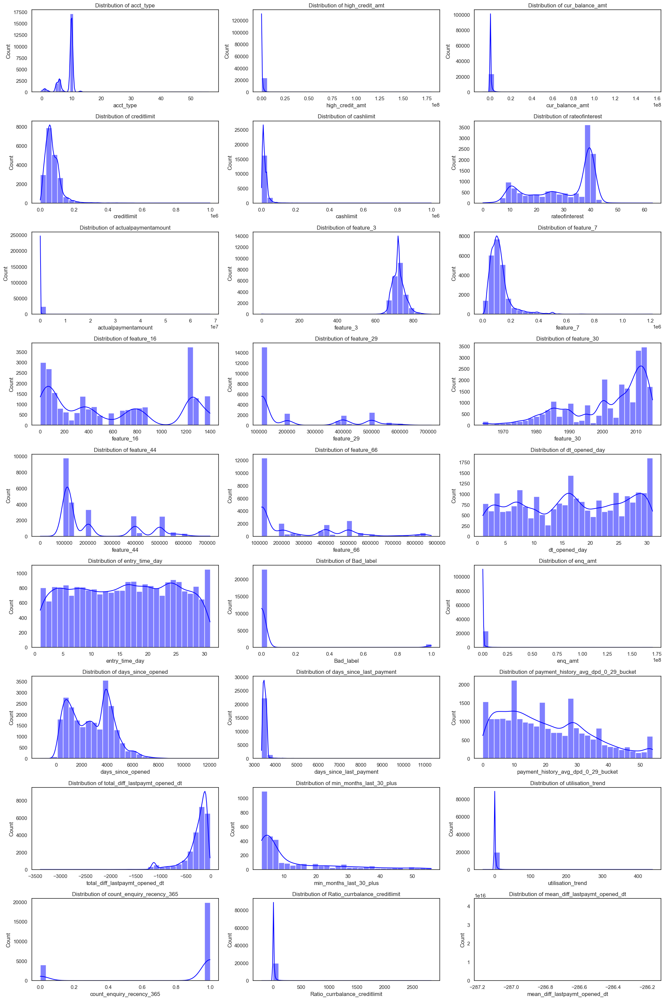

In [201]:
# Set up the figure size and style
plt.figure(figsize=(20, 30))
sns.set(style="white")

# Plot histograms for each column in the entire df dataset
for i, column in enumerate(df.columns, 1):
    plt.subplot(9, 3, i)  # 2 rows, 4 columns of subplots (adjust according to the number of columns in df)
    sns.histplot(df[column], kde=True, color='blue', bins=30)
    plt.title(f'Distribution of {column}')
    plt.tight_layout()

plt.show()

## From the displayed univariate distribution plots, here are some key insights:

1. **acct_type**: The distribution is skewed with most data points concentrated around lower values. There might be categorical values represented numerically.

2. **high_credit_amt**: Highly right-skewed distribution, indicating a few customers have very high credit limits while most have low credit amounts.

3. **cur_balance_amt**: Also right-skewed, suggesting that most customers have low balance amounts, while a few have significantly high balances.

4. **creditlimit**: Similar right-skewed pattern, showing that most customers have lower credit limits.

5. **cashlimit**: Follows a similar trend as credit limit, meaning fewer customers have access to higher cash limits.

6. **rateofinterest**: This feature appears to have a multimodal distribution, which suggests different interest rate groups (e.g., different loan types or customer segments).

7. **actualpaymentamount**: This distribution is highly right-skewed, indicating that most customers make small payments, while a few make significantly larger payments.

8. **feature_3**: The distribution is concentrated around a specific range, possibly representing a categorical or standardized numerical feature.

9. **feature_7**: Right-skewed, indicating that most observations have smaller values, but a few outliers exist with higher values.

10. **feature_16**: The distribution appears to be multimodal, suggesting the presence of multiple clusters or categories within the data.

11. **feature_29**: Right-skewed distribution with most values concentrated at lower levels, while a few outliers have significantly higher values.

12. **feature_30**: This feature likely represents a time-related variable (e.g., years). The increasing trend suggests that more data points are concentrated in recent years.

13. **feature_44**: A right-skewed distribution with multiple peaks, which may indicate different groups or segments within the dataset.

14. **feature_66**: Similar to feature_29 and feature_44, it shows a right-skewed distribution, meaning most data points are concentrated at lower values.

15. **dt_opened_day**: The distribution appears fairly uniform, suggesting that account openings are evenly spread across the days of the month.

16. **entry_time_day**: This feature has a nearly uniform distribution, indicating that data points are equally distributed across different time periods in a day.

17. **Bad_label**: This binary feature has most of its values concentrated near 0, indicating that the dataset is highly imbalanced (i.e., very few instances of bad cases).

18. **enq_amt**: A highly right-skewed distribution, meaning most data points have low values, while a few have extremely high values.

19. **days_since_opened**: The distribution shows a peak in the middle and a decline towards higher values. Indicates that most accounts have been opened for a few thousand days (~5–10 years).

20. **days_since_last_payment**: Highly right-skewed, meaning most customers have made payments recently, while very few have delayed payments for a long time.

21. **payment_history_avg_dpd_0_29_bucket**: Fairly uniform distribution with fluctuations. Suggests a wide range of values, indicating different payment behavior among customers.

22. **total_diff_lastpaymt_opened_dt**: This distribution is slightly skewed, with a peak near zero. Suggests that most last payments were made within a reasonable time from the account opening.

23. **min_months_last_30_plus**: Right-skewed distribution. Most customers have minimal late payment history, but a few have long overdue payments.

24. **utilisation_trend**: Highly right-skewed with a significant peak near zero. Indicates that most customers use a small percentage of their credit limit, but a few have high utilization.

25. **count_enquiry_recency_365**: Most values are close to zero, meaning very few customers made frequent credit inquiries in the last year. There is a peak near 1, meaning some customers have made a few inquiries.

26. **Ratio_curbalance_creditlimit**: Highly right-skewed, with most values near zero. Suggests that most customers maintain a low credit balance compared to their limit.

27. **mean_diff_lastpaymt_opened_dt**: The data appears to have an issue—possibly an extreme outlier or erroneous values. It needs further investigation.


### Bivariate Analysis

In [203]:
# Continuous columns 
cont_col = df[['high_credit_amt', 'creditlimit', 'cashlimit', 'rateofinterest', 'actualpaymentamount', 'feature_3', 'feature_7', 'feature_29',
                 'feature_30', 'feature_44', 'feature_66', 'enq_amt', 'payment_history_avg_dpd_0_29_bucket', 'min_months_last_30_plus', 
                 'utilisation_trend', 'Ratio_currbalance_creditlimit', 'mean_diff_lastpaymt_opened_dt']]

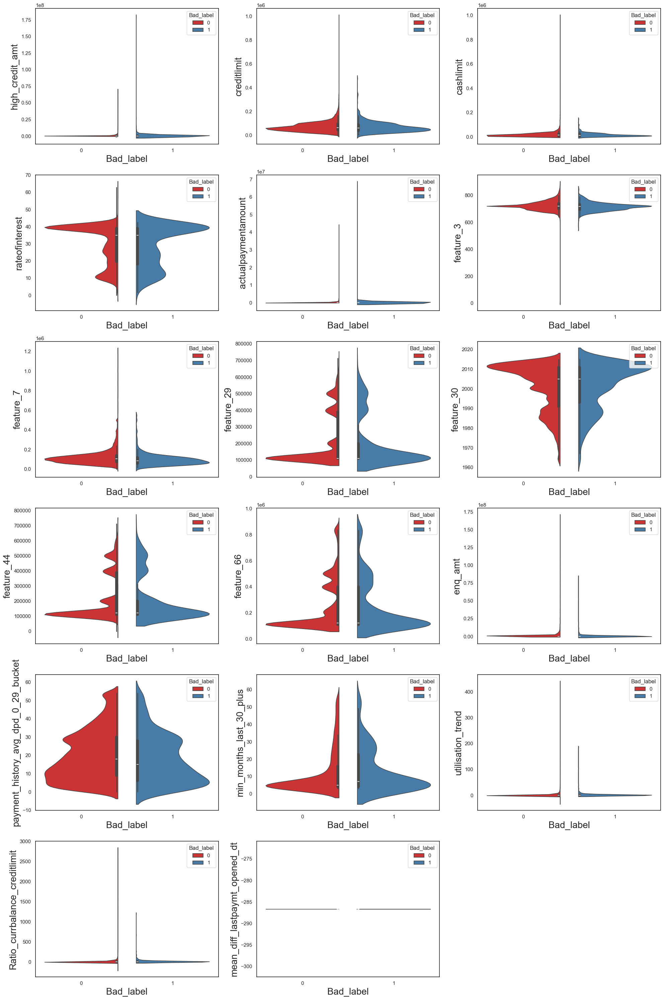

In [204]:
plt.figure(figsize=(20, 30), facecolor='white')  # Set the canvas size
plotnumber = 1  # Counter for subplot numbering

for column in cont_col:  # Accessing each column in cont_col
    if plotnumber <= 17:  # Adjust the number of subplots as needed
        ax = plt.subplot(6, 3, plotnumber)  # 6 rows, 2 columns grid for 12 subplots
        sns.violinplot(x=df['Bad_label'], y=df[column], hue=df['Bad_label'], split=True, palette='Set1')
        plt.xlabel('Bad_label', fontsize=20)  # Set x-axis label with font size 20
        plt.ylabel(column, fontsize=20)  # Set y-axis label with font size 20
    plotnumber += 1  # Increment counter

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()

## Insights from Bivariate Analysis
### Relationship Between Input Features and Output (Bad Label):

1. **high_credit_amt**:  
   - Both bad (1) and good (0) credit labels have high concentrations near zero.  
   - Higher credit amounts are slightly more common for the bad label, indicating that customers with larger credit amounts may be more prone to default.

2. **creditlimit**:  
   - The distribution is similar for both labels, but bad-labeled customers tend to have a slightly broader spread.  
   - Higher credit limits seem to be more common among good credit customers.

3. **cashlimit**:  
   - The majority of both groups have lower cash limits.  
   - The bad-labeled customers show slightly higher peaks, implying that lower cash limits might be linked to increased risk.

4. **rateofinterest**:  
   - Customers with bad labels (1) tend to have a more spread-out distribution, with a concentration at lower interest rates.  
   - Good credit customers have more stable interest rate distributions.

5. **actualpaymentamount**:  
   - Both groups have high density near zero, with a few extreme high values.  
   - Good credit customers tend to make higher payments.

6. **feature_3**:  
   - Both groups show similar distributions, with a slight difference in spread.  
   - There is no strong separation between bad and good credit customers.  

7. **feature_7**:  
   - The distribution is similar for both good (0) and bad (1) labels.
   - There is a slight tendency for bad-labeled customers to have higher values, but overall separation is weak.

8. **feature_29**:  
   - Good credit customers (0) have a more concentrated distribution.
   - Bad credit customers (1) exhibit a broader spread with higher peaks, indicating a possible correlation.

9. **feature_30**:  
   - This feature appears to represent a year-based variable (e.g., account opening year or birth year).
   - Bad credit customers tend to have lower values compared to good credit ones, which may indicate older accounts or customers are more prone to default.

10. **feature_44**:  
   - Similar to feature_29, bad-labeled customers have a broader distribution.
   - Good-labeled customers show more concentration at lower values.

11. **feature_66**:  
   - The pattern is similar to other numerical features, with bad credit customers showing a more dispersed distribution.
   - Higher values seem slightly more associated with bad labels.

12. **enq_amt (Enquiry Amount)**:  
   - Both categories have peaks near zero, but bad-labeled customers seem to have a slightly higher spread.
   - This might indicate that customers with more credit inquiries are at a higher risk of default.



13. **payment_history_avg_dpdb_0_29_bucket**:  
   - Customers with a bad label (1) tend to have lower values, while good credit customers (0) have a broader distribution.
   - This suggests that lower payment history scores might be linked to a higher risk of bad credit.

14. **min_months_last_30_plus**:  
   - Good credit customers (0) generally have higher values, indicating a longer time since their last 30+ day delinquency.
   - Bad credit customers (1) tend to have lower values, meaning they had a delinquency more recently, which is a strong indicator of financial risk.

15. **utilisation_trend**:  
   - Both good and bad credit customers have distributions concentrated near zero.
   - However, there is a slight tendency for bad-labeled customers to have a higher spread, meaning utilization trends could be a weak predictor of bad credit behavior.

16. **Ratio_currbalance_creditlimit**:  
   - The distribution shows a sharp peak near zero for both labels.
   - Bad-labeled customers (1) have a slightly broader spread, suggesting a potential correlation between high utilization and financial risk.

17. **mean_diff_lastpaymt_opened_dt**:  
   - This feature appears to be constant across both good (0) and bad (1) labels, indicating that it may not be an important predictor.

 

In [205]:
# Discrete columns
dis_col = df[['cur_balance_amt', 'feature_16', 'dt_opened_day', 'entry_time_day', 'days_since_opened',
                'days_since_last_payment', 'total_diff_lastpaymt_opened_dt', 'count_enquiry_recency_365']]


<Figure size 2000x1000 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

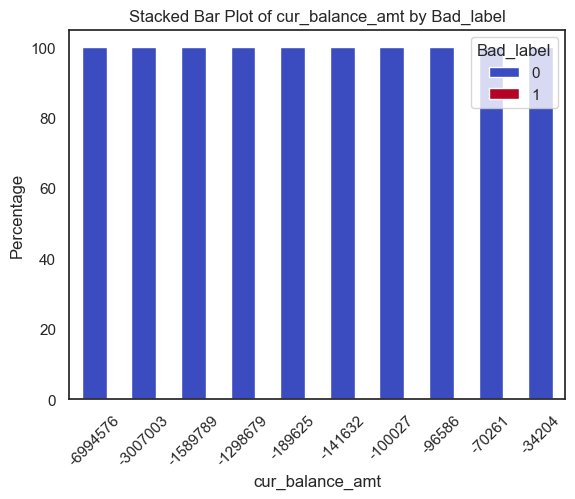

<Figure size 1000x600 with 0 Axes>

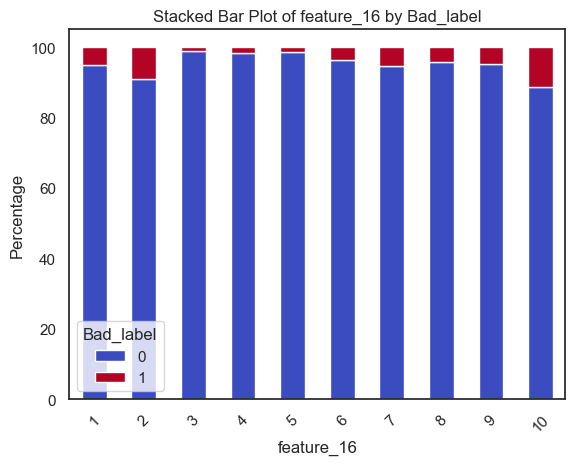

<Figure size 1000x600 with 0 Axes>

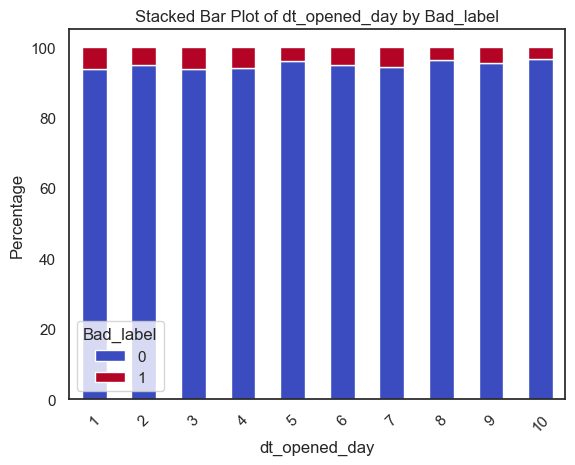

<Figure size 1000x600 with 0 Axes>

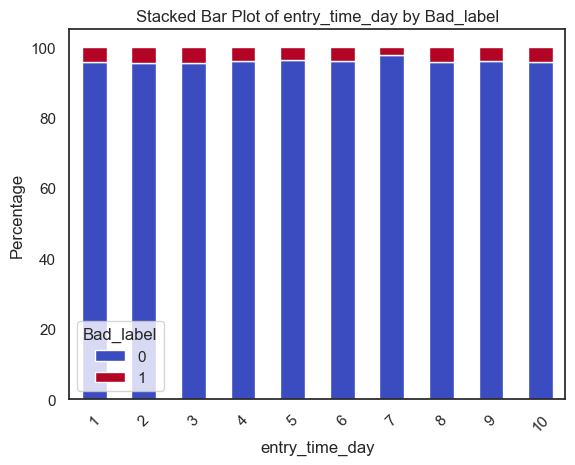

<Figure size 1000x600 with 0 Axes>

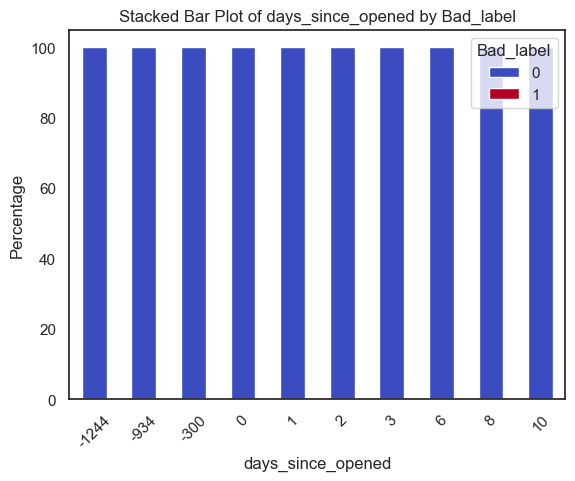

<Figure size 1000x600 with 0 Axes>

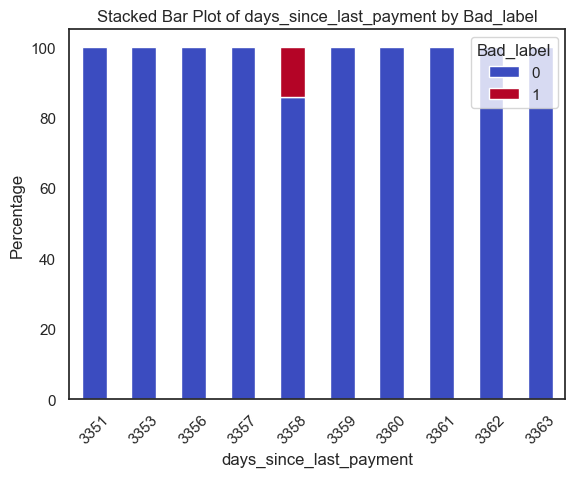

<Figure size 1000x600 with 0 Axes>

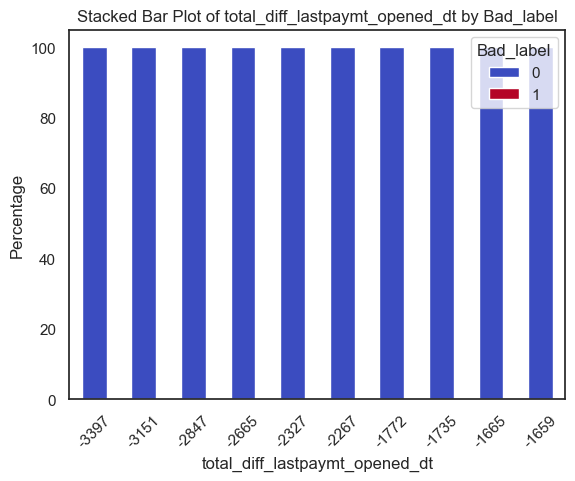

<Figure size 1000x600 with 0 Axes>

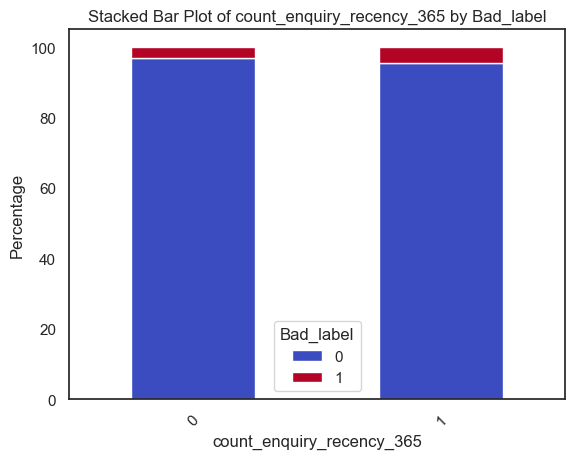

In [206]:
plt.figure(figsize=(20, 10))

for column in dis_col.columns:
    plt.figure(figsize=(10, 6))
    
    # Create proportion table
    crosstab_data = pd.crosstab(data[column], data['Bad_label'], normalize='index') * 100
    crosstab_data = crosstab_data.iloc[:10, :]  # Show only top 10 categories
    
    # Plot
    crosstab_data.plot(kind='bar', stacked=True, colormap='coolwarm')
    plt.title(f'Stacked Bar Plot of {column} by Bad_label')
    plt.xlabel(column)
    plt.ylabel('Percentage')
    plt.legend(title="Bad_label", labels=['0', '1'])
    plt.xticks(rotation=45)
    plt.show()


### Insights 
1. The stacked bar plot shows that cur_balance_amt does not significantly differentiate between good (0) and bad (1) credit labels, as most values belong to good credit. 
2. The stacked bar plot of feature_16 by Bad_label shows that most values belong to good credit (0), while bad credit (1) appears in smaller proportions across different feature values. This suggests that feature_16 has some influence on bad credit classification, but additional analysis is needed to determine its predictive strength.
3. The stacked bar plot of dt_opened_day by Bad_label indicates that the proportion of good (0) and bad (1) credit labels remains relatively consistent across different days. This suggests that dt_opened_day does not have a strong influence on distinguishing good and bad credit cases, as the distribution remains stable.
4. The stacked bar plot of entry_time_day by Bad_label shows that the proportion of good (0) and bad (1) credit labels remains relatively stable across different entry time days. This indicates that entry_time_day does not have a strong impact on distinguishing between good and bad credit labels, as the distribution remains nearly identical across all values.
5. The stacked bar plot of days_since_opened by Bad_label indicates that the distribution of good (0) and bad (1) credit labels remains fairly consistent across different values of days_since_opened. The proportion of bad credit cases (1) is relatively small compared to good credit cases (0) in all categories.
6. The plot shows that days_since_last_payment is mostly associated with good credit (0), but at 3358 days, there is a noticeable increase in bad credit (1). This suggests that longer payment gaps might be a risk factor for bad credit, making this feature potentially useful for credit risk prediction.
7. The plot indicates that total_diff_lastpaymt_opened_dt does not significantly differentiate between good (0) and bad (1) credit labels, as almost all values belong to the good credit category. This suggests that this feature might not be a strong predictor of bad credit.
8. The stacked bar plot shows that count_enquiry_recency_365 has a small proportion of bad credit (1) cases, while most values belong to the good credit (0) category. This suggests that recent credit inquiries might have a slight influence on bad credit but are not a dominant predictor.

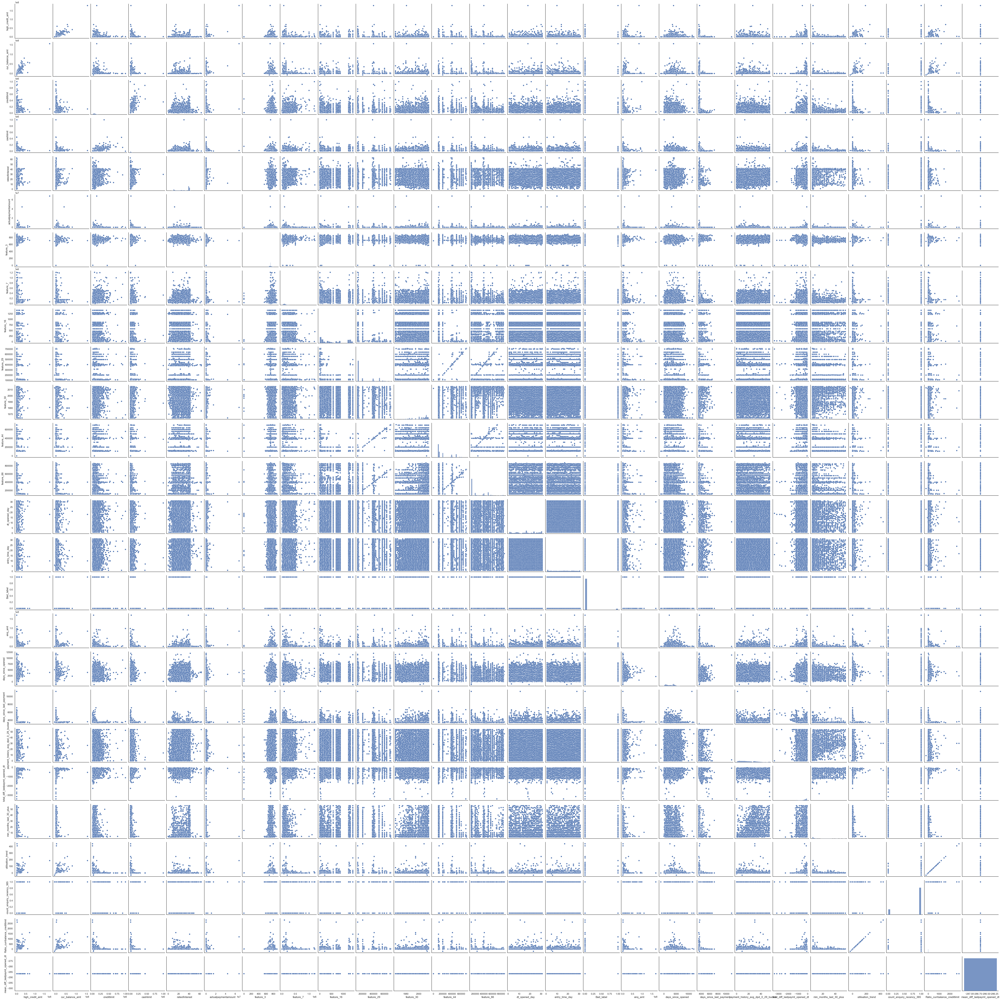

In [207]:
sns.pairplot(df)

### Data Preprocessing

In [209]:
data.columns

Index(['customer_no', 'dt_opened_x', 'upload_dt_x', 'acct_type', 'owner_indic',
       'closed_dt', 'reporting_dt', 'high_credit_amt', 'cur_balance_amt',
       'amt_past_due', 'paymenthistory1', 'paymenthistory2', 'paymt_str_dt',
       'paymt_end_dt', 'creditlimit', 'cashlimit', 'rateofinterest',
       'paymentfrequency', 'actualpaymentamount', 'feature_3', 'feature_7',
       'feature_16', 'feature_29', 'feature_30', 'feature_44', 'feature_66',
       'dt_opened_day', 'entry_time_day', 'Bad_label', 'dt_opened_y',
       'upload_dt_y', 'enquiry_dt', 'enq_purpose', 'enq_amt',
       'days_since_opened', 'days_since_last_payment',
       'payment_history_avg_dpd_0_29_bucket', 'total_diff_lastpaymt_opened_dt',
       'min_months_last_30_plus', 'utilisation_trend',
       'count_enquiry_recency_365', 'Ratio_currbalance_creditlimit',
       'mean_diff_lastpaymt_opened_dt'],
      dtype='object')

**Before starting data preprocessing, we should remove variables that do not contribute to the model's predictive power.**

* **customer_no** :This is a unique identifier for each customer, and although it’s important for identifying and merging records, it does not contribute to the model's predictive ability regarding creditworthiness. Remove it as it doesn't provide information on the credit history or behavior of customers.

* **dt_opened_x & dt_opened_y** :Both dt_opened_x and dt_opened_y likely represent the same information (the account opened date). Having two identical features won't add value and could create noise Remove both.
* **upload_dt_x & upload_dt_y** :These represent timestamps for when the data was uploaded. Since they are not related to a customer's credit behavior or history, they do not contribute to predicting the credit score. Remove both.

*  **closed_dt** :While the closed date can give some insight into the customer's account activity, it’s typically less relevant than the last payment date or current balance for predicting creditworthiness. Additionally, if most accounts are open, this feature might not offer much predictive power.

*  **reporting_dt** :This column might indicate when the report was generated or updated but does not represent any information directly related to the credit history or financial behavior of the customer.

*  **paymt_str_dt & paymt_end_dt** :paymt_str_dt and paymt_end_dt do not provide strong predictive power for credit default, as other payment-related features already capture repayment behavior. Keeping them may introduce noise and redundancy, so they can be dropped to simplify the dataset.
  
*  **enquiry_dt & enq_purpose** :While these variables could provide insights into a customer’s credit application history, they may not be as directly relevant for predicting credit risk based on past behavior (like payment history or current balance). It’s worth testing but may not add significant value to the model in its current form.

In [212]:
data.drop(columns = ['customer_no','dt_opened_x','dt_opened_y','upload_dt_x','upload_dt_y','closed_dt','reporting_dt','paymt_str_dt','paymt_end_dt','enquiry_dt','enq_purpose','paymenthistory1','paymenthistory2','owner_indic','amt_past_due','paymentfrequency'],inplace = True)

### 1. Checking Missing values

In [214]:
data.isnull().sum()

acct_type                                  0
high_credit_amt                           13
cur_balance_amt                            0
creditlimit                             4024
cashlimit                               5461
rateofinterest                         10914
actualpaymentamount                        0
feature_3                                  0
feature_7                                  0
feature_16                                 0
feature_29                                 0
feature_30                                 0
feature_44                                 0
feature_66                                 0
dt_opened_day                              0
entry_time_day                             0
Bad_label                                  0
enq_amt                                  109
days_since_opened                          0
days_since_last_payment                    0
payment_history_avg_dpd_0_29_bucket        0
total_diff_lastpaymt_opened_dt             0
min_months

In [215]:
# Calculate the percentage of missing values for each column
missing_percentage = data.isnull().mean() * 100

# Display the missing percentages
print(missing_percentage)

acct_type                               0.000000
high_credit_amt                         0.054402
cur_balance_amt                         0.000000
creditlimit                            16.839638
cashlimit                              22.853197
rateofinterest                         45.672916
actualpaymentamount                     0.000000
feature_3                               0.000000
feature_7                               0.000000
feature_16                              0.000000
feature_29                              0.000000
feature_30                              0.000000
feature_44                              0.000000
feature_66                              0.000000
dt_opened_day                           0.000000
entry_time_day                          0.000000
Bad_label                               0.000000
enq_amt                                 0.456143
days_since_opened                       0.000000
days_since_last_payment                 0.000000
payment_history_avg_

Dropping **rateofinterest (45.67%)** and **min_months_last_30_plus (87.00%)** :Too many missing values, making it unreliable.

In [217]:
data.drop(['rateofinterest','min_months_last_30_plus'],axis = 1 , inplace = True)

In [218]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 25 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   acct_type                            23896 non-null  category
 1   high_credit_amt                      23883 non-null  float64 
 2   cur_balance_amt                      23896 non-null  int64   
 3   creditlimit                          19872 non-null  float64 
 4   cashlimit                            18435 non-null  float64 
 5   actualpaymentamount                  23896 non-null  float64 
 6   feature_3                            23896 non-null  float64 
 7   feature_7                            23896 non-null  float64 
 8   feature_16                           23896 non-null  int64   
 9   feature_29                           23896 non-null  float64 
 10  feature_30                           23896 non-null  float64 
 11  feature_44     

### Handling missing values

In [220]:
from sklearn.impute import SimpleImputer
# 1. Categorical columns (Impute with the most frequent value)
data['acct_type'] = data['acct_type'].fillna(data['acct_type'].mode()[0])
data['utilisation_trend'] = data['utilisation_trend'].fillna(data['utilisation_trend'].mode()[0])
data['Ratio_currbalance_creditlimit'] = data['Ratio_currbalance_creditlimit'].fillna(data['Ratio_currbalance_creditlimit'].mode()[0])

In [221]:
# 2. Datetime column (Impute with the median date or a placeholder)
data['days_since_last_payment'] = data['days_since_last_payment'].fillna(data['days_since_last_payment'].median())  # Fill missing with median date

In [222]:
# 3. Numerical columns (Impute with the median)
data['high_credit_amt'] = data['high_credit_amt'].fillna(data['high_credit_amt'].median())
data['creditlimit'] = data['creditlimit'].fillna(data['creditlimit'].median())
data['cashlimit'] = data['cashlimit'].fillna(data['cashlimit'].median())
data['enq_amt'] = data['enq_amt'].fillna(data['enq_amt'].median())
data['utilisation_trend'] = data['utilisation_trend'].fillna(data['utilisation_trend'].median())
data['Ratio_currbalance_creditlimit'] = data['Ratio_currbalance_creditlimit'].fillna(data['Ratio_currbalance_creditlimit'].median())

In [223]:
# Check if there are any remaining missing values
print(data.isnull().sum())

acct_type                              0
high_credit_amt                        0
cur_balance_amt                        0
creditlimit                            0
cashlimit                              0
actualpaymentamount                    0
feature_3                              0
feature_7                              0
feature_16                             0
feature_29                             0
feature_30                             0
feature_44                             0
feature_66                             0
dt_opened_day                          0
entry_time_day                         0
Bad_label                              0
enq_amt                                0
days_since_opened                      0
days_since_last_payment                0
payment_history_avg_dpd_0_29_bucket    0
total_diff_lastpaymt_opened_dt         0
utilisation_trend                      0
count_enquiry_recency_365              0
Ratio_currbalance_creditlimit          0
mean_diff_lastpa

### Encoding

In [225]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23896 entries, 0 to 23895
Data columns (total 25 columns):
 #   Column                               Non-Null Count  Dtype   
---  ------                               --------------  -----   
 0   acct_type                            23896 non-null  category
 1   high_credit_amt                      23896 non-null  float64 
 2   cur_balance_amt                      23896 non-null  int64   
 3   creditlimit                          23896 non-null  float64 
 4   cashlimit                            23896 non-null  float64 
 5   actualpaymentamount                  23896 non-null  float64 
 6   feature_3                            23896 non-null  float64 
 7   feature_7                            23896 non-null  float64 
 8   feature_16                           23896 non-null  int64   
 9   feature_29                           23896 non-null  float64 
 10  feature_30                           23896 non-null  float64 
 11  feature_44     

#### acct_type

In [227]:
data['acct_type'].unique()

[10, 1, 2, 5, 3, ..., 32, 52, 56, 4, 35]
Length: 22
Categories (31, int64): [0, 1, 2, 3, ..., 55, 56, 57, 59]

In [228]:
# Calculate the mean of the target variable for each category in 'acct_type'
target_mean = data.groupby('acct_type')['Bad_label'].mean()

# Map the mean values to the 'acct_type' column
data['acct_type'] = data['acct_type'].map(target_mean)

### Checking the outliers

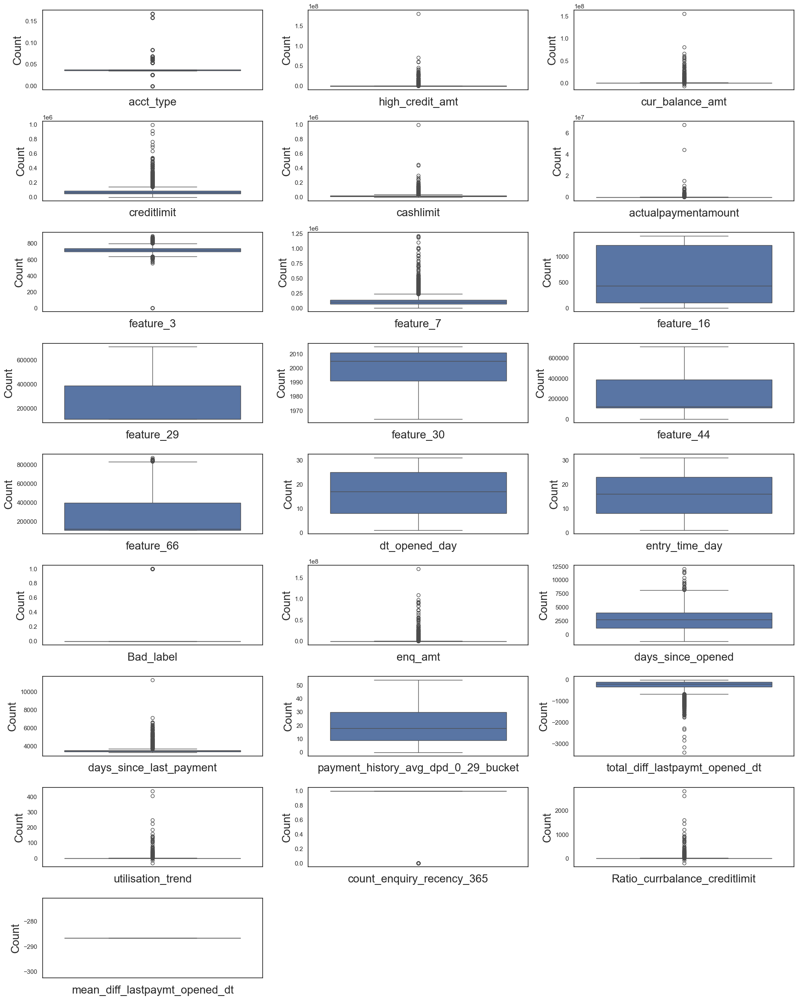

In [230]:
plt.figure(figsize=(20,25))

plotnumber=1
for column in data:
    if plotnumber<=25:
        ax=plt.subplot(9,3,plotnumber)
        sns.boxplot(data[column])
        plt.xlabel(column, fontsize=20)
        plt.ylabel('Count',fontsize=20)
    plotnumber+=1
plt.tight_layout()

### Outlier Handling

Creating a function that calculates the IQR and then filters out the outliers.

In [233]:
def remove_outliers(data, column):
    Q1 =data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    median_value = data[column].median() 
    data[column] = data[column].apply(lambda x: median_value if x < lower_bound or x > upper_bound else x) 
    return sns.boxplot(x=column,data=data)

In [234]:
data.columns

Index(['acct_type', 'high_credit_amt', 'cur_balance_amt', 'creditlimit',
       'cashlimit', 'actualpaymentamount', 'feature_3', 'feature_7',
       'feature_16', 'feature_29', 'feature_30', 'feature_44', 'feature_66',
       'dt_opened_day', 'entry_time_day', 'Bad_label', 'enq_amt',
       'days_since_opened', 'days_since_last_payment',
       'payment_history_avg_dpd_0_29_bucket', 'total_diff_lastpaymt_opened_dt',
       'utilisation_trend', 'count_enquiry_recency_365',
       'Ratio_currbalance_creditlimit', 'mean_diff_lastpaymt_opened_dt'],
      dtype='object')

#### 1.acct_type

<Axes: xlabel='acct_type'>

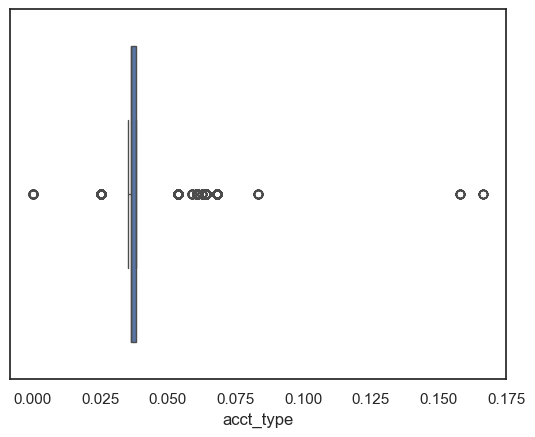

In [236]:
sns.boxplot(x='acct_type',data=data)

<Axes: xlabel='acct_type'>

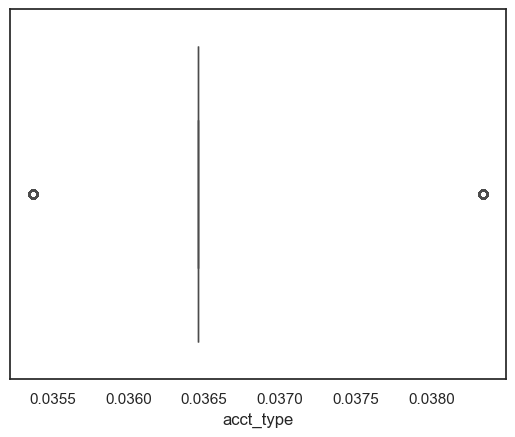

In [237]:
remove_outliers(data,'acct_type')

#### high_credit_amt

<Axes: xlabel='high_credit_amt'>

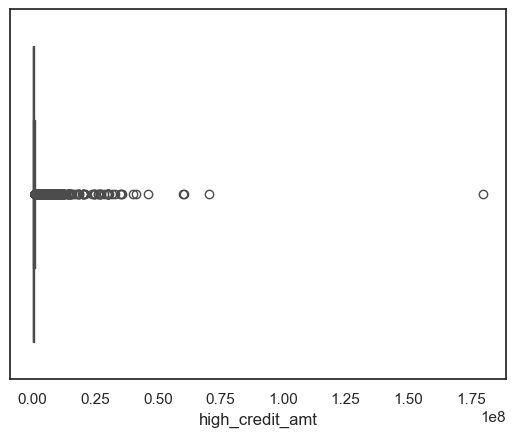

In [239]:
sns.boxplot(x='high_credit_amt',data=data)

<Axes: xlabel='high_credit_amt'>

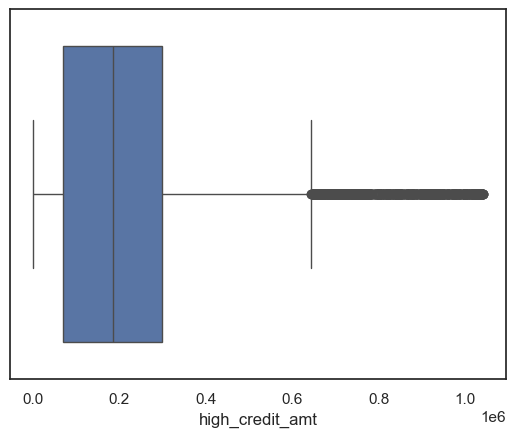

In [240]:
remove_outliers(data,'high_credit_amt')

#### cur_balance_amt

<Axes: xlabel='cur_balance_amt'>

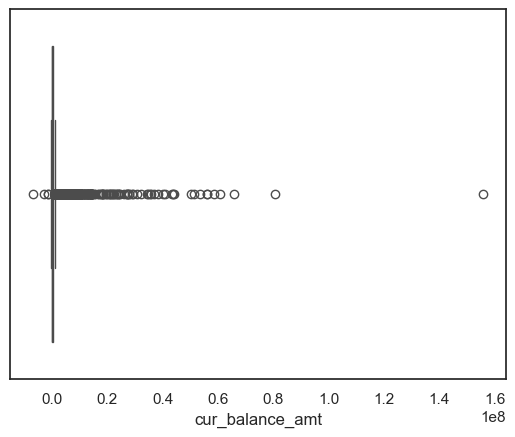

In [242]:
sns.boxplot(x='cur_balance_amt',data=data)

<Axes: xlabel='cur_balance_amt'>

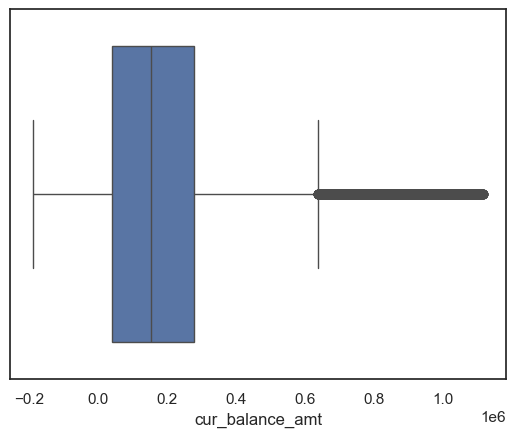

In [243]:
remove_outliers(data,'cur_balance_amt')

#### creditlimit

<Axes: xlabel='creditlimit'>

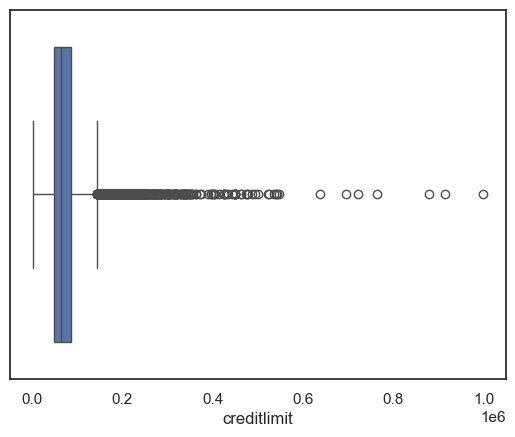

In [245]:
sns.boxplot(x='creditlimit',data=data)

<Axes: xlabel='creditlimit'>

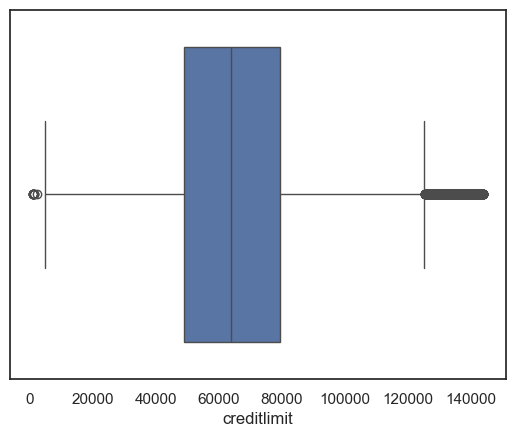

In [246]:
remove_outliers(data,'creditlimit')

#### cashlimit

<Axes: xlabel='cashlimit'>

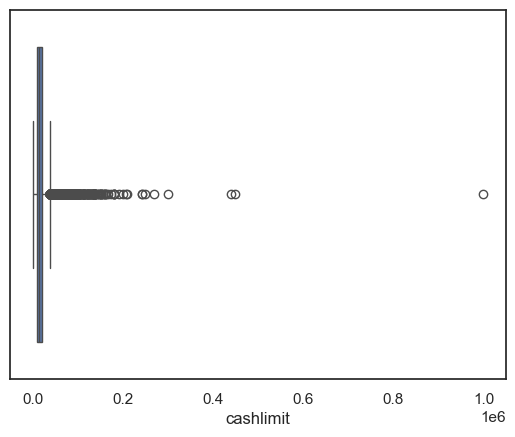

In [248]:
sns.boxplot(x='cashlimit',data=data)

<Axes: xlabel='cashlimit'>

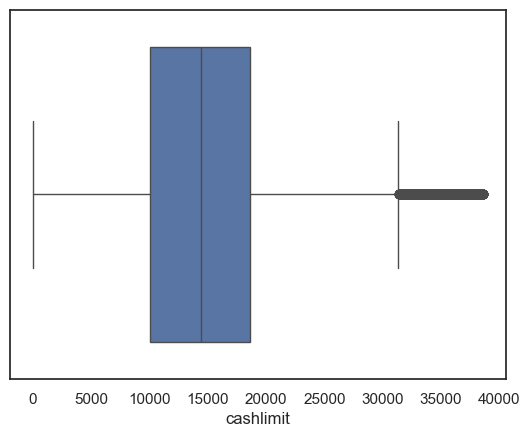

In [249]:
remove_outliers(data,'cashlimit')

#### actualpaymentamount

<Axes: xlabel='actualpaymentamount'>

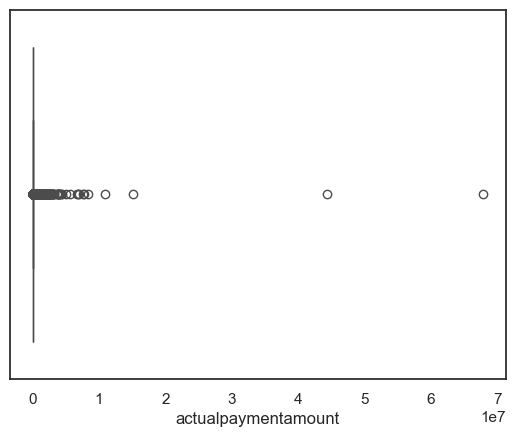

In [251]:
sns.boxplot(x='actualpaymentamount',data=data)

<Axes: xlabel='actualpaymentamount'>

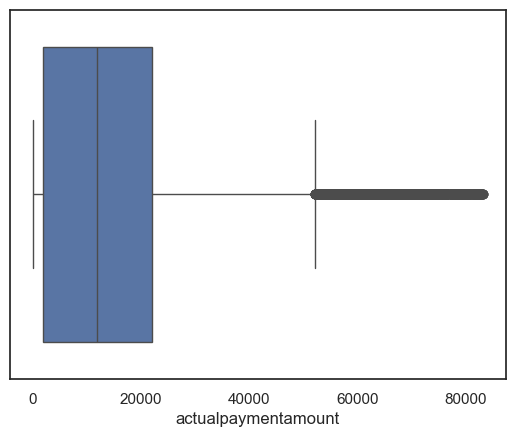

In [252]:
remove_outliers(data,'actualpaymentamount')

#### feature_3

<Axes: xlabel='feature_3'>

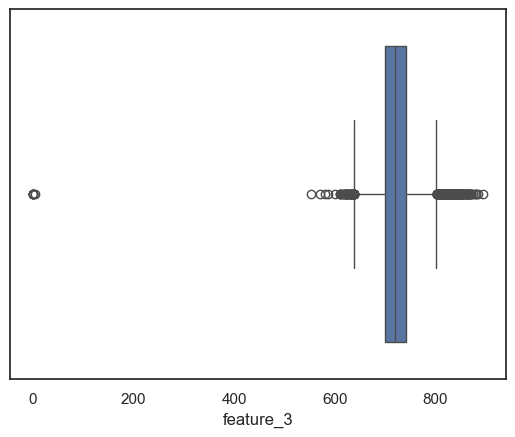

In [254]:
sns.boxplot(x='feature_3',data=data)

<Axes: xlabel='feature_3'>

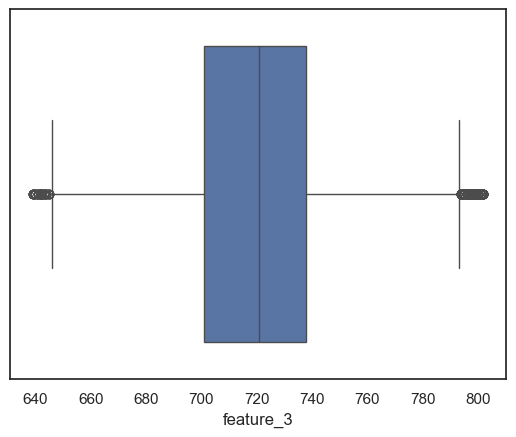

In [255]:
remove_outliers(data,'feature_3')

#### feature_7

<Axes: xlabel='feature_7'>

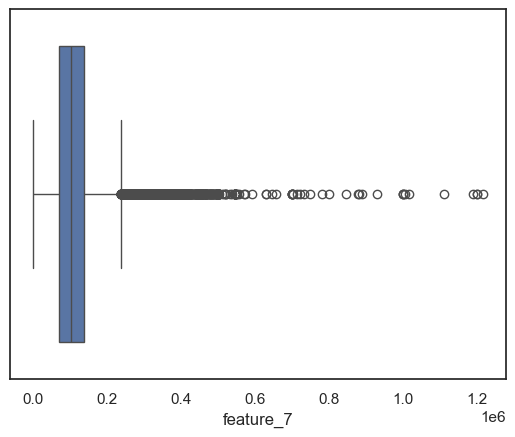

In [257]:
sns.boxplot(x='feature_7',data=data)

<Axes: xlabel='feature_7'>

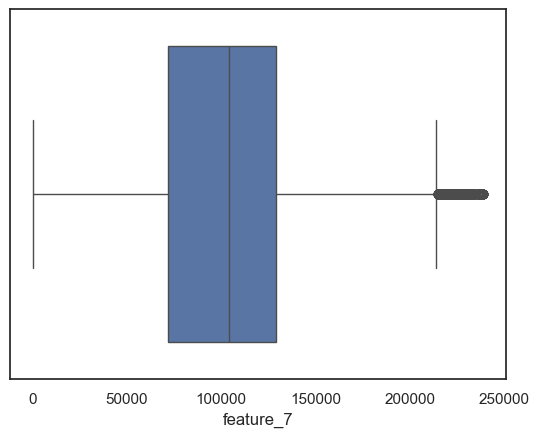

In [258]:
remove_outliers(data,'feature_7')

#### feature_16

<Axes: xlabel='feature_16'>

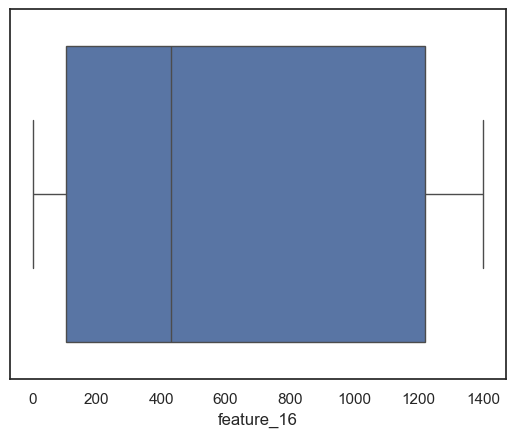

In [260]:
sns.boxplot(x='feature_16',data=data)

#### feature_29

<Axes: xlabel='feature_29'>

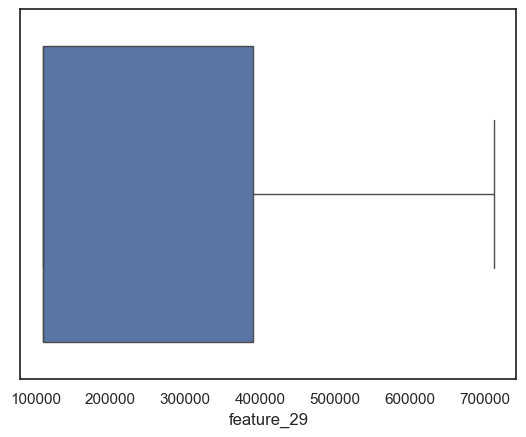

In [262]:
sns.boxplot(x='feature_29',data=data)

#### feature_30

<Axes: xlabel='feature_30'>

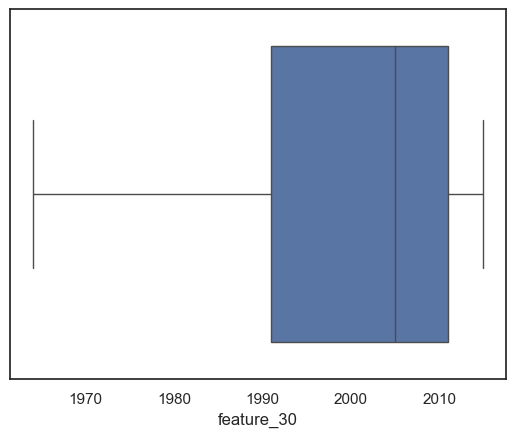

In [264]:
sns.boxplot(x='feature_30',data=data)

#### feature_44

<Axes: xlabel='feature_44'>

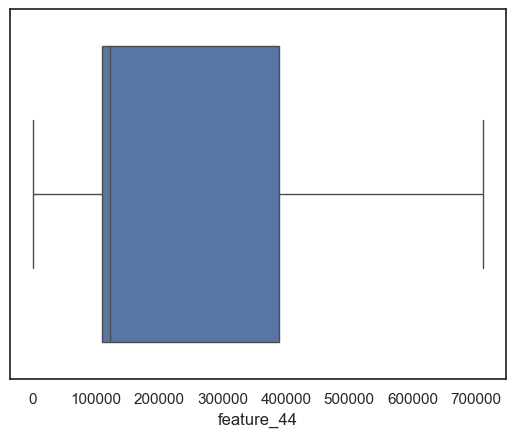

In [266]:
sns.boxplot(x='feature_44',data=data)

#### feature_66

<Axes: xlabel='feature_66'>

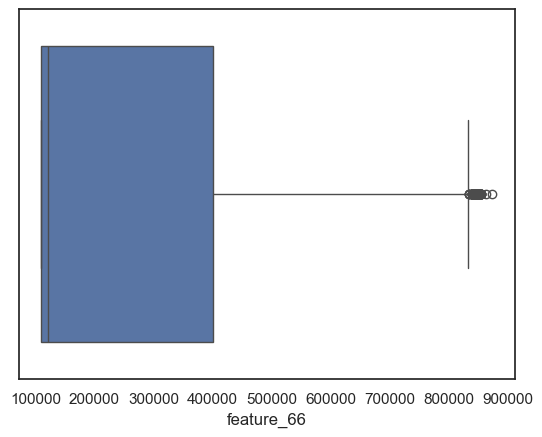

In [268]:
sns.boxplot(x='feature_66',data=data)

<Axes: xlabel='feature_66'>

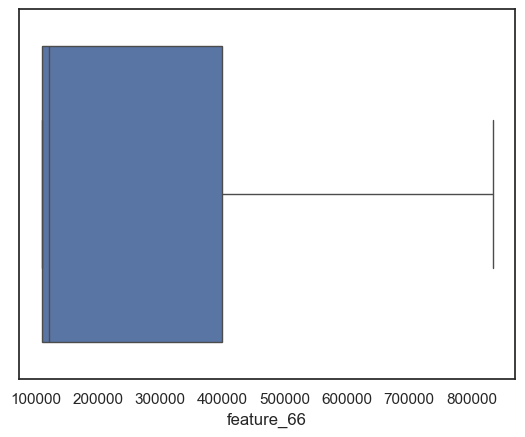

In [269]:
remove_outliers(data,'feature_66')

#### dt_opened_day

<Axes: xlabel='dt_opened_day'>

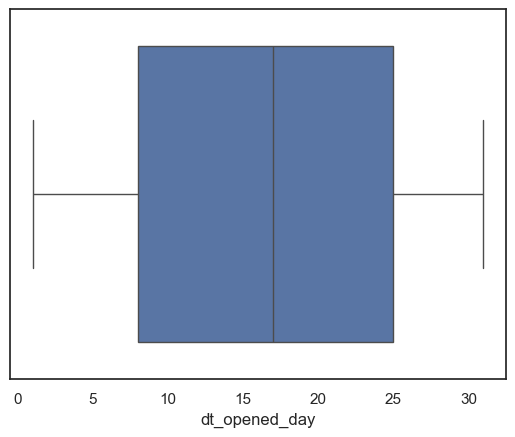

In [271]:
sns.boxplot(x='dt_opened_day',data=data)

#### entry_time_day

<Axes: xlabel='entry_time_day'>

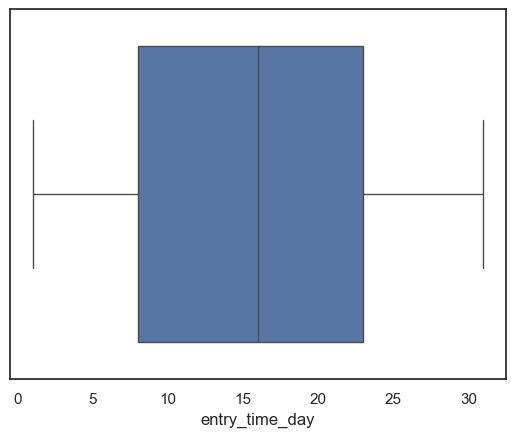

In [273]:
sns.boxplot(x='entry_time_day',data=data)

#### enq_amt

<Axes: xlabel='enq_amt'>

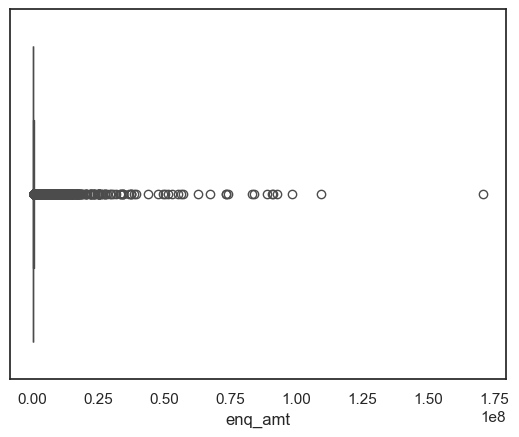

In [275]:
sns.boxplot(x='enq_amt',data=data)

<Axes: xlabel='enq_amt'>

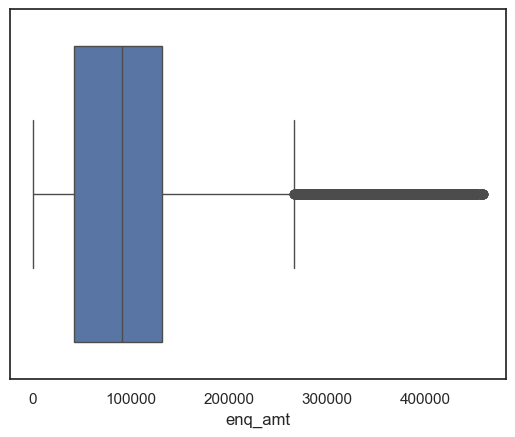

In [276]:
remove_outliers(data,'enq_amt')

#### days_since_opened

<Axes: xlabel='days_since_opened'>

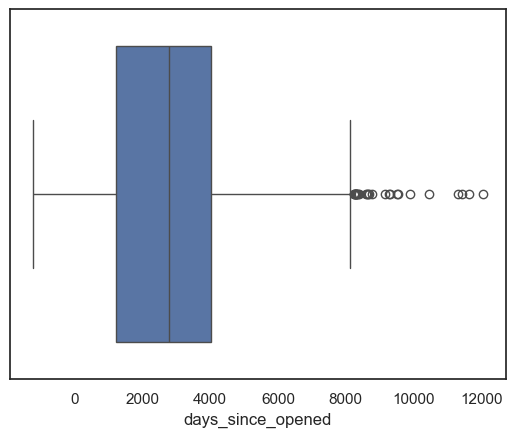

In [278]:
sns.boxplot(x='days_since_opened',data=data)

<Axes: xlabel='days_since_opened'>

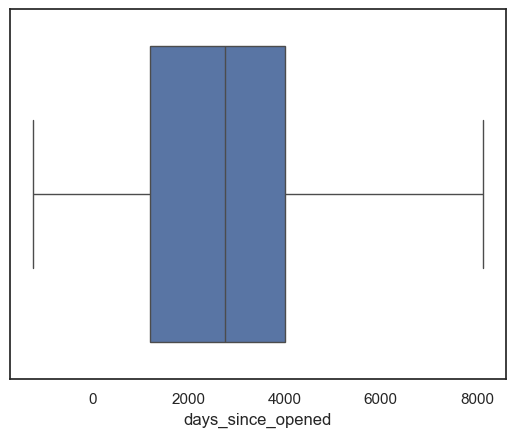

In [279]:
remove_outliers(data,'days_since_opened')

#### days_since_last_payment

<Axes: xlabel='days_since_last_payment'>

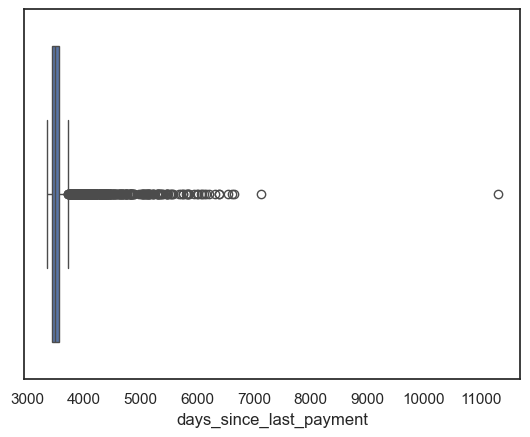

In [281]:
sns.boxplot(x='days_since_last_payment',data=data)

<Axes: xlabel='days_since_last_payment'>

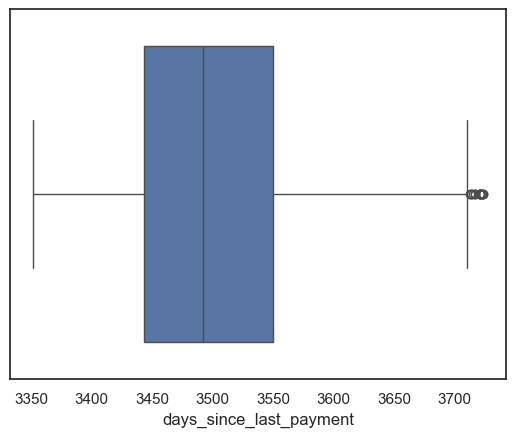

In [282]:
remove_outliers(data,'days_since_last_payment')

#### total_diff_lastpaymt_opened_dt

<Axes: xlabel='total_diff_lastpaymt_opened_dt'>

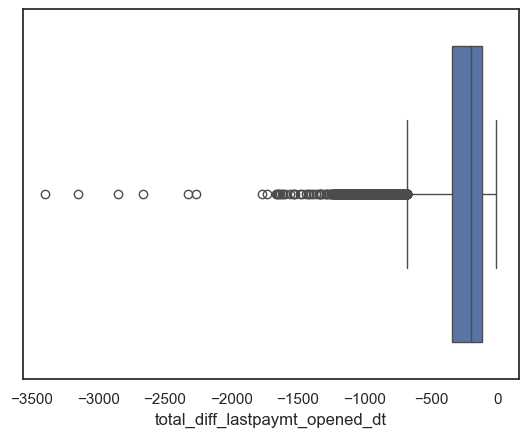

In [284]:
sns.boxplot(x='total_diff_lastpaymt_opened_dt',data=data)

<Axes: xlabel='total_diff_lastpaymt_opened_dt'>

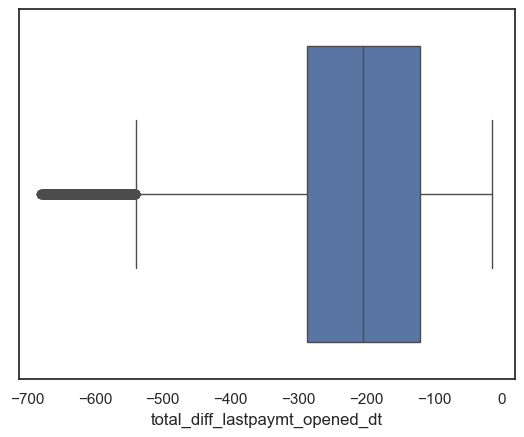

In [285]:
remove_outliers(data,'total_diff_lastpaymt_opened_dt')

#### utilisation_trend

<Axes: xlabel='utilisation_trend'>

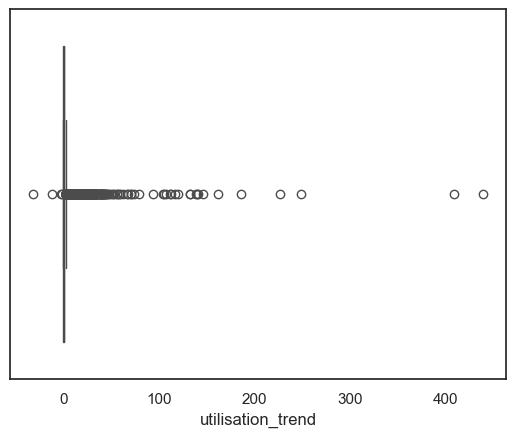

In [287]:
sns.boxplot(x='utilisation_trend',data=data)

<Axes: xlabel='utilisation_trend'>

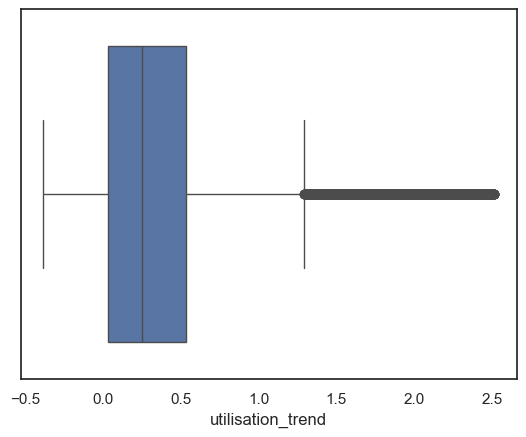

In [288]:
remove_outliers(data,'utilisation_trend')

#### Ratio_currbalance_creditlimit

<Axes: xlabel='Ratio_currbalance_creditlimit'>

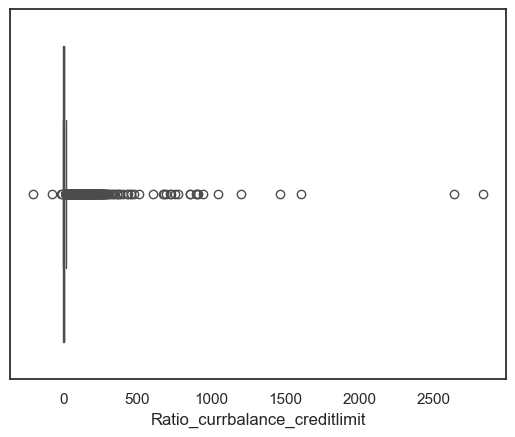

In [290]:
sns.boxplot(x='Ratio_currbalance_creditlimit',data=data)

<Axes: xlabel='Ratio_currbalance_creditlimit'>

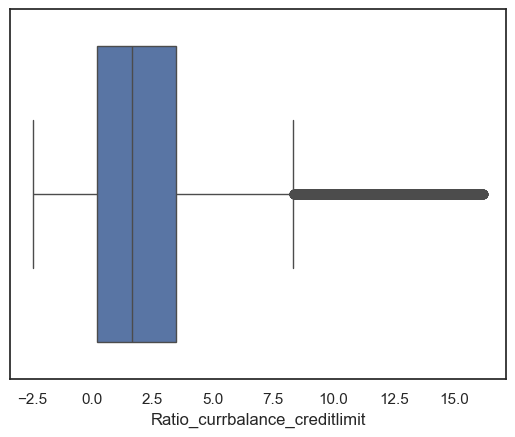

In [291]:
remove_outliers(data,'Ratio_currbalance_creditlimit')

### Scaling

In [293]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
d1=['Bad_label']
data1=sc.fit_transform(data.drop(d1,axis=1))

In [294]:
data1

array([[-4.22640731e-02, -1.70803718e-01, -2.30498167e-01, ...,
        -2.22025416e+00,  3.29158112e+00, -5.68434189e-14],
       [-4.22640731e-02,  3.71455808e+00, -7.61633473e-01, ...,
         4.50398886e-01, -7.53619525e-01, -5.68434189e-14],
       [-4.22640731e-02, -4.83721104e-01, -8.17765459e-01, ...,
        -2.22025416e+00, -7.62478184e-01, -5.68434189e-14],
       ...,
       [-4.22640731e-02, -9.66514345e-01, -8.86512989e-01, ...,
        -2.22025416e+00, -7.19744057e-01, -5.68434189e-14],
       [-4.22640731e-02,  8.47132399e-01,  7.18979379e-01, ...,
         4.50398886e-01,  5.39917828e-01, -5.68434189e-14],
       [-4.22640731e-02, -1.70803718e-01,  3.03917694e+00, ...,
         4.50398886e-01,  2.75468580e+00, -5.68434189e-14]])

### Feature Selection

<Axes: >

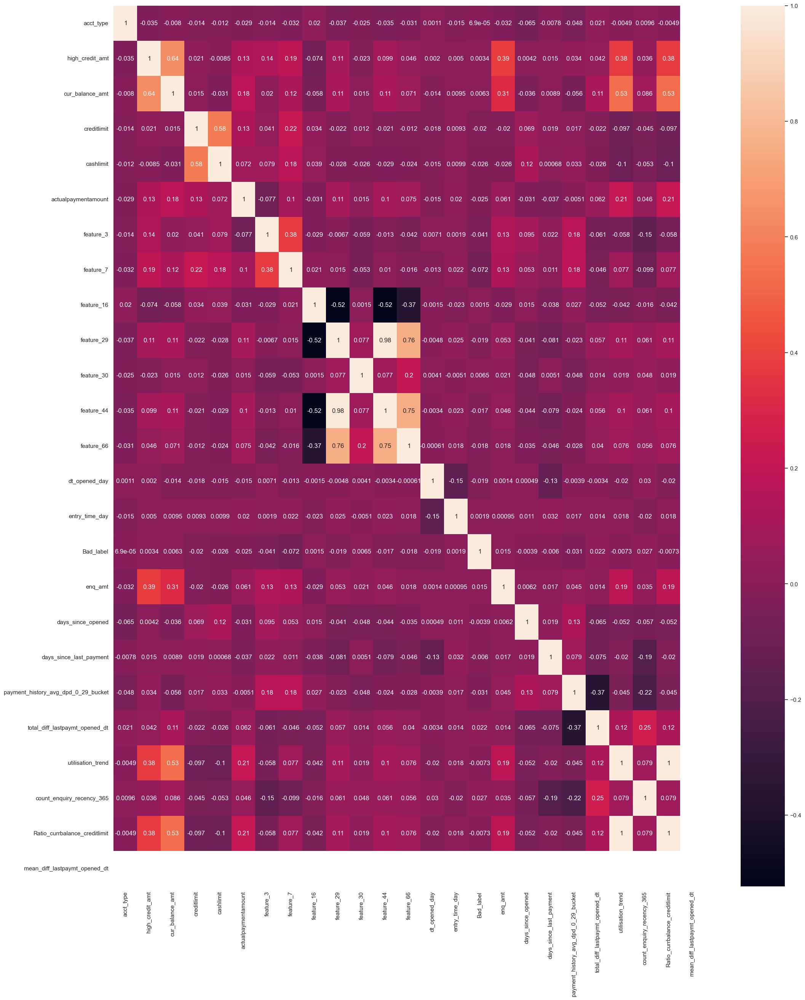

In [296]:
plt.figure(figsize=(25,30))
sns.heatmap(data.corr(), annot=True)

### Correlation Analysis

In [298]:
# Compute correlation with the target variable
correlation = data.corr()['Bad_label'].sort_values(ascending=False)

In [299]:
correlation

Bad_label                              1.000000
count_enquiry_recency_365              0.027476
total_diff_lastpaymt_opened_dt         0.022281
enq_amt                                0.014504
feature_30                             0.006487
cur_balance_amt                        0.006309
high_credit_amt                        0.003380
entry_time_day                         0.001885
feature_16                             0.001470
acct_type                              0.000069
days_since_opened                     -0.003916
days_since_last_payment               -0.005983
utilisation_trend                     -0.007343
Ratio_currbalance_creditlimit         -0.007343
feature_44                            -0.017156
feature_66                            -0.018011
feature_29                            -0.018638
dt_opened_day                         -0.019446
creditlimit                           -0.020170
actualpaymentamount                   -0.024885
cashlimit                             -0

#### Feature Importance

In [301]:
from sklearn.ensemble import RandomForestClassifier

X = data.drop(columns=['Bad_label'])
y = data['Bad_label']

model = RandomForestClassifier(random_state=42)
model.fit(X, y)

# Get feature importance
importances = model.feature_importances_
feature_importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)
print(feature_importance_df)

                                Feature  Importance
16                    days_since_opened    0.063937
15                              enq_amt    0.057444
19       total_diff_lastpaymt_opened_dt    0.055279
2                       cur_balance_amt    0.052686
1                       high_credit_amt    0.052075
7                             feature_7    0.051960
17              days_since_last_payment    0.049686
12                           feature_66    0.048230
6                             feature_3    0.047878
9                            feature_29    0.046640
8                            feature_16    0.045090
11                           feature_44    0.044499
14                       entry_time_day    0.044451
10                           feature_30    0.044174
13                        dt_opened_day    0.044055
18  payment_history_avg_dpd_0_29_bucket    0.043544
5                   actualpaymentamount    0.043307
4                             cashlimit    0.041710
3           

#### Recursive Feature Selection (RFE) with a Random Forest model

In [303]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize Random Forest Classifier
model = RandomForestClassifier(n_estimators=100)

# Initialize RFE with RandomForest model
rfe = RFE(estimator=model, n_features_to_select=20)  # Number of features to keep

# Fit RFE on the training data
rfe.fit(X_train, y_train)

# Get selected and dropped features
selected_features = X_train.columns[rfe.support_]
dropped_features = X_train.columns[~rfe.support_]

print("Selected features:", selected_features)
print("Dropped features:", dropped_features)

# Build model with selected features
X_train_selected = X_train[selected_features]
X_test_selected = X_test[selected_features]

model.fit(X_train_selected, y_train)

# Make predictions
y_pred = model.predict(X_test_selected)

# Evaluate model
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy:.4f}")

Selected features: Index(['high_credit_amt', 'cur_balance_amt', 'creditlimit', 'cashlimit',
       'actualpaymentamount', 'feature_3', 'feature_7', 'feature_16',
       'feature_29', 'feature_30', 'feature_44', 'feature_66', 'dt_opened_day',
       'entry_time_day', 'enq_amt', 'days_since_opened',
       'days_since_last_payment', 'payment_history_avg_dpd_0_29_bucket',
       'total_diff_lastpaymt_opened_dt', 'utilisation_trend'],
      dtype='object')
Dropped features: Index(['acct_type', 'count_enquiry_recency_365',
       'Ratio_currbalance_creditlimit', 'mean_diff_lastpaymt_opened_dt'],
      dtype='object')
Model Accuracy: 0.9586


In [304]:
selected_features

Index(['high_credit_amt', 'cur_balance_amt', 'creditlimit', 'cashlimit',
       'actualpaymentamount', 'feature_3', 'feature_7', 'feature_16',
       'feature_29', 'feature_30', 'feature_44', 'feature_66', 'dt_opened_day',
       'entry_time_day', 'enq_amt', 'days_since_opened',
       'days_since_last_payment', 'payment_history_avg_dpd_0_29_bucket',
       'total_diff_lastpaymt_opened_dt', 'utilisation_trend'],
      dtype='object')

In [305]:
# Final selected features

In [306]:
data = data[['high_credit_amt', 'cur_balance_amt', 'creditlimit', 'cashlimit',
       'actualpaymentamount', 'feature_3', 'feature_7', 'feature_16',
       'feature_29', 'feature_30', 'feature_44', 'feature_66', 'dt_opened_day',
       'entry_time_day', 'enq_amt', 'days_since_opened',
       'days_since_last_payment', 'payment_history_avg_dpd_0_29_bucket',
       'total_diff_lastpaymt_opened_dt', 'utilisation_trend','Bad_label']]

### PCA

In [308]:
from sklearn.decomposition import PCA

In [309]:
# Step 1: Perform PCA without specifying n_components
pca = PCA()
pca.fit(data1)

PCA()

In [310]:
# Step 2: Calculate cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

In [311]:
# Step 3: Determine the number of components to retain
threshold = 0.95  # Set your desired threshold (e.g., 95% variance)
n_components = np.argmax(cumulative_variance >= threshold) + 1
print(f"Number of components to retain 95% variance: {n_components}")

Number of components to retain 95% variance: 18


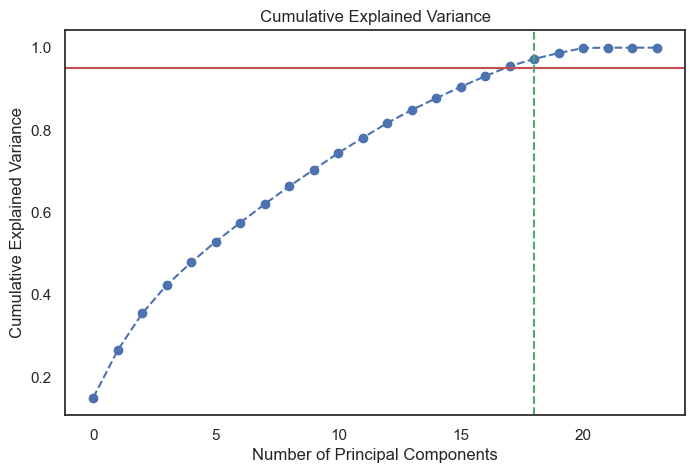

In [312]:
# Step 4: Visualize the explained variance
plt.figure(figsize=(8, 5))
plt.plot(cumulative_variance, marker='o', linestyle='--')
plt.axhline(y=threshold, color='r', linestyle='-')
plt.axvline(x=n_components, color='g', linestyle='--')
plt.title('Cumulative Explained Variance')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [313]:
# Step 5: Perform PCA with the optimal number of components
pca_optimal = PCA(n_components=n_components)
pca_data = pca_optimal.fit_transform(data1)

In [314]:
# Step 6: Create a DataFrame for the transformed data (optional)
import pandas as pd
pca_df = pd.DataFrame(pca_data, columns=[f"PC{i+1}" for i in range(n_components)])
pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18
0,3.672517,1.512500,0.993901,1.476201,-3.286350,-2.479099,2.397408,-0.758875,2.917434,-0.164625,-1.320497,0.912541,1.653508,0.750231,2.963625,0.488804,1.475729,1.076022
1,2.347760,-1.912934,2.346385,2.867706,1.308772,1.573613,1.250100,-1.082445,2.179121,0.816200,-0.904830,0.141988,0.706104,-1.675522,-1.594274,1.621147,-1.125214,-0.760725
2,0.764123,-3.155023,3.378145,2.669739,0.051636,0.608591,2.398839,-0.881657,2.098512,0.077544,0.375182,-0.487707,0.919512,0.016527,0.707728,1.330749,-1.222490,-1.011655
3,1.222734,-0.906517,2.504596,2.283759,-0.383116,-0.608396,1.285313,-0.820042,2.489223,0.564752,2.211075,-0.538540,1.080554,0.651091,0.433952,0.069119,1.167535,-0.525934
4,-1.967445,-0.621643,1.437188,2.061713,-2.263521,1.254143,0.732714,0.332078,0.010115,-0.599950,-0.246609,-1.006694,0.155463,-0.337657,-0.385059,-0.643485,-2.182988,0.415788


#### Split iput features and output into X and y

In [316]:
np.random.seed(42)

In [317]:
X=pca_df           #independent variable
y=data.Bad_label      #dependent variable

In [318]:
from collections import Counter# importing counter to check count of each label
from imblearn.over_sampling import SMOTE #for balancing the data
sm=SMOTE()#object creation
print(Counter(y))# checking count for each class 
X_sm,y_sm=sm.fit_resample(X,y)#applying sampling on target variable 
print(Counter(y_sm))# checking count after sampling for  each class

Counter({0: 22892, 1: 1004})
Counter({0: 22892, 1: 22892})


#### Split the X and y for training and testing (X_train, y_train, X_test, y_test)

In [320]:
## preparing training and testing data
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_sm, y_sm, test_size=0.20, random_state=42)

In [321]:
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,precision_score,classification_report,f1_score

### 1. Logistic Regression

In [323]:
from sklearn.linear_model import LogisticRegression
clf=LogisticRegression(random_state=42)
clf.fit(X_train, y_train)   #training

LogisticRegression(random_state=42)

In [324]:
y_pred1=clf.predict(X_test)

In [325]:
y_train_pred1=clf.predict(X_train)

#### Accuracy Of test data

In [327]:
pd.crosstab(y_test,y_pred1)#it will show you confusion matrix

col_0,0,1
Bad_label,,
0,2651,1922
1,1634,2950


In [328]:
a1=accuracy_score(y_test,y_pred1)
a1

0.6116632084743912

In [329]:
r1=recall_score(y_test,y_pred1)
r1

0.643542757417103

In [330]:
p1=precision_score(y_test,y_pred1)
p1

0.6055008210180624

In [331]:
f1=round(f1_score(y_test,y_pred1),2)
f1

0.62

In [332]:
print(classification_report(y_test,y_pred1))

              precision    recall  f1-score   support

           0       0.62      0.58      0.60      4573
           1       0.61      0.64      0.62      4584

    accuracy                           0.61      9157
   macro avg       0.61      0.61      0.61      9157
weighted avg       0.61      0.61      0.61      9157



#### Accuracy of Training data

In [334]:
a_1=accuracy_score(y_train,y_train_pred1)
a_1

0.6073934529172469

In [335]:
r_1=recall_score(y_train,y_train_pred1)
r_1

0.6389556478042386

In [336]:
f_1=round(f1_score(y_train,y_train_pred1),2)
f_1

0.62

In [337]:
pd.crosstab(y_train,y_train_pred1)

col_0,0,1
Bad_label,,
0,10549,7770
1,6610,11698


### Cross Validation

In [339]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(clf,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())
#std of < 0.05 is good. 

[0.62700229 0.60744849 0.62083901]
Cross validation Score: 0.6184299325941224
Std : 0.008162535237951601


In [340]:
c1=round(scores.mean(),2)

#### ROC AUC Curve

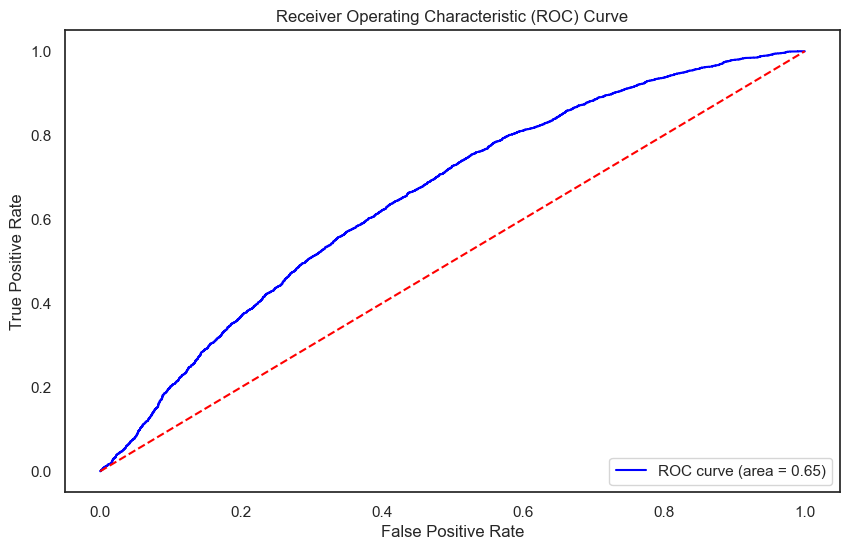

ROC AUC Score: 0.65


In [342]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Predict probabilities
y_pred_prob = clf.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [343]:
R1=round(roc_auc,2)

### 2.  Decision Tree Classifier

In [345]:
from sklearn.tree import DecisionTreeClassifier  #importing decision tree from sklearn.tree
dt=DecisionTreeClassifier(random_state=42)      #object creation for decision tree  
dt.fit(X_train,y_train)     #training the model 

DecisionTreeClassifier(random_state=42)

In [346]:
y_pred2=dt.predict(X_test)

In [347]:
y_train_pred2=dt.predict(X_train)

#### Accuracy of testing data

In [349]:
pd.crosstab(y_test,y_pred2)

col_0,0,1
Bad_label,,
0,3697,876
1,499,4085


In [350]:
a2=accuracy_score(y_test,y_pred2)
a2

0.8498416511958065

In [351]:
r2=recall_score(y_test,y_pred2)
r2

0.8911431064572426

In [352]:
p2=precision_score(y_test,y_pred2)
p2

0.8234226970368878

In [353]:
f2=round(f1_score(y_test,y_pred2),2)
f2

0.86

In [354]:
print(classification_report(y_test,y_pred2))

              precision    recall  f1-score   support

           0       0.88      0.81      0.84      4573
           1       0.82      0.89      0.86      4584

    accuracy                           0.85      9157
   macro avg       0.85      0.85      0.85      9157
weighted avg       0.85      0.85      0.85      9157



#### Accuracy of training data

In [356]:
a_2=accuracy_score(y_train,y_train_pred2)
a_2

1.0

In [357]:
r_2=recall_score(y_train,y_train_pred2)
r_2

1.0

In [358]:
f_2=f1_score(y_train,y_train_pred2)
f_2

1.0

In [359]:
pd.crosstab(y_train,y_train_pred2)

col_0,0,1
Bad_label,,
0,18319,0
1,0,18308


#### Cross Validation

In [361]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(dt,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())
#std of < 0.05 is good. 

[0.83713611 0.83338568 0.83533123]
Cross validation Score: 0.8352843406574961
Std : 0.0015314675905410936


In [362]:
c2=round(scores.mean(),2)

#### ROC AUC Curve

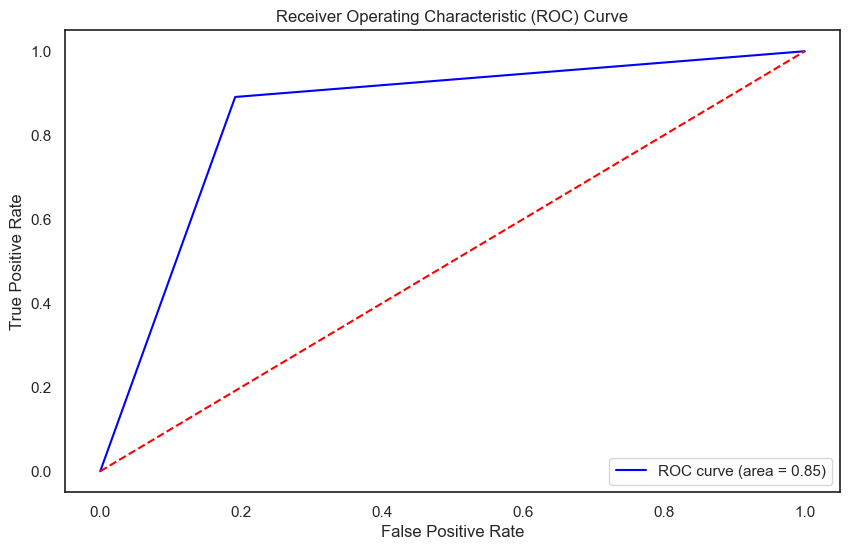

ROC AUC Score: 0.85


In [364]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Predict probabilities
y_pred_prob = dt.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [365]:
R2=round(roc_auc,2)

### 3. Random Forest Classifier

In [367]:
from sklearn.ensemble import RandomForestClassifier #importing randomforest

rf_clf = RandomForestClassifier(n_estimators=80,random_state=42,n_jobs=1) #object creation ,taking 100 decision tree in random forest 
rf_clf.fit(X_train,y_train)  #training the data

RandomForestClassifier(n_estimators=80, n_jobs=1, random_state=42)

In [368]:
y_pred3=rf_clf.predict(X_test)

In [369]:
y_train_pred3 = rf_clf.predict(X_train)

#### Accuracy of testing data

In [371]:
pd.crosstab(y_test,y_pred3)

col_0,0,1
Bad_label,,
0,4438,135
1,103,4481


In [372]:
a3=accuracy_score(y_test,y_pred3)
a3

0.9740089548978923

In [373]:
r3=recall_score(y_test,y_pred3)
r3

0.9775305410122164

In [374]:
p3=precision_score(y_test,y_pred3)
p3

0.9707538994800693

In [375]:
f3=round(f1_score(y_test,y_pred3),2)
f3

0.97

In [376]:
print(classification_report(y_test,y_pred3))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97      4573
           1       0.97      0.98      0.97      4584

    accuracy                           0.97      9157
   macro avg       0.97      0.97      0.97      9157
weighted avg       0.97      0.97      0.97      9157



#### Accuracy of Training data

In [378]:
a_3=accuracy_score(y_train,y_train_pred3)
a_3

1.0

In [379]:
f_3=f1_score(y_train,y_train_pred3)
f_3

1.0

#### Cross Validation

In [381]:
# checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(rf_clf,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())

[0.95691057 0.95210993 0.95603046]
Cross validation Score: 0.955016985362894
Std : 0.0020867657217041053


In [382]:
c3=round(scores.mean(),2)

#### ROC AUC Curve

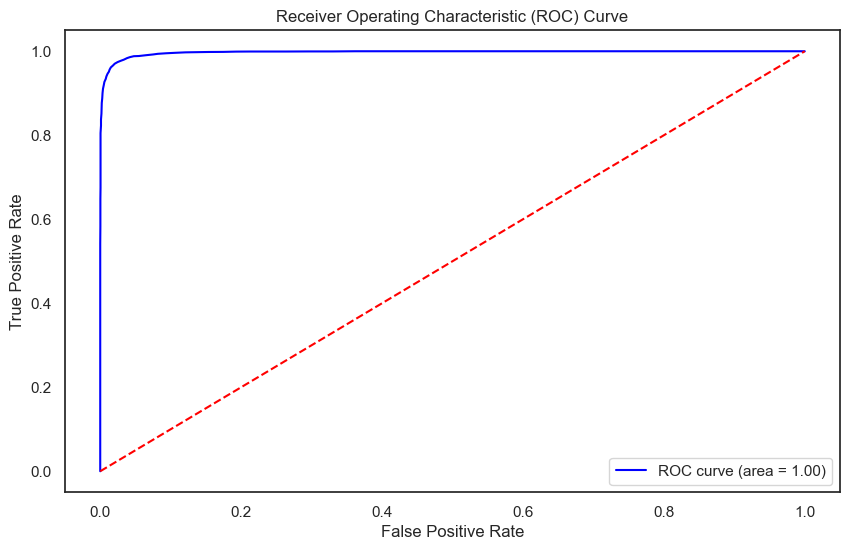

ROC AUC Score: 1.00


In [384]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Predict probabilities
y_pred_prob = rf_clf.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [385]:
R3=round(roc_auc,2)

### 4. Bagging Classifier

In [387]:
from sklearn.ensemble import BaggingClassifier

# Create a Bagging Classifier
bagging_clf = BaggingClassifier(random_state=42,n_jobs=1)

# Train the classifier
bagging_clf.fit(X_train, y_train)

BaggingClassifier(n_jobs=1, random_state=42)

In [388]:
y_pred4=bagging_clf.predict(X_test)

In [389]:
y_train_pred4=bagging_clf.predict(X_train)

#### Accuracy of testing data

In [391]:
pd.crosstab(y_test, y_pred4)

col_0,0,1
Bad_label,,
0,4307,266
1,260,4324


In [392]:
a4=accuracy_score(y_test,y_pred4)
a4

0.9425576062029049

In [393]:
r4=recall_score(y_test,y_pred4)
r4

0.9432809773123909

In [394]:
p4=precision_score(y_test,y_pred4)
p4

0.9420479302832244

In [395]:
f4=round(f1_score(y_test,y_pred4),2)
f4

0.94

In [396]:
print(classification_report(y_test,y_pred4))

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      4573
           1       0.94      0.94      0.94      4584

    accuracy                           0.94      9157
   macro avg       0.94      0.94      0.94      9157
weighted avg       0.94      0.94      0.94      9157



#### Accuracy of training data

In [398]:
a_4=accuracy_score(y_train,y_train_pred4)
a_4

0.9985529800420455

In [399]:
f_4=f1_score(y_train,y_train_pred4)
f_4

0.9985512396468305

#### Cross Validation

In [401]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(bagging_clf,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())

[0.92172211 0.91625777 0.91780031]
Cross validation Score: 0.9185933986187566
Std : 0.0023002178601305425


In [402]:
c4=round(scores.mean(),2)

#### ROC AUC Curve

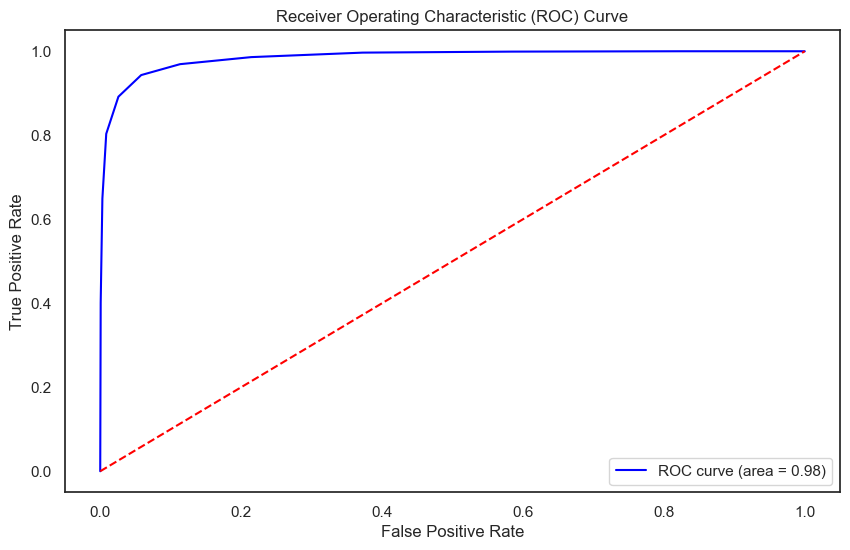

ROC AUC Score: 0.98


In [404]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Predict probabilities
y_pred_prob = bagging_clf.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [405]:
R4=round(roc_auc,2)

### 5. Gradient Boosting Classifier

In [407]:
## importing the model library
from sklearn.ensemble import GradientBoostingClassifier
gbm=GradientBoostingClassifier(random_state=42)  ## object creation
gbm.fit(X_train,y_train)       ## fitting the data

GradientBoostingClassifier(random_state=42)

In [408]:
y_pred5=gbm.predict(X_test)

In [409]:
y_train_pred5=gbm.predict(X_train)

#### Accuracy of testing data

In [411]:
pd.crosstab(y_test,y_pred5)

col_0,0,1
Bad_label,,
0,2903,1670
1,1016,3568


In [412]:
a5=accuracy_score(y_test,y_pred5)
a5

0.7066724909904991

In [413]:
r5=recall_score(y_test,y_pred5)
r5

0.7783595113438045

In [414]:
p5=precision_score(y_test,y_pred5)
p5

0.6811760213822069

In [415]:
f5=round(f1_score(y_test,y_pred5),2)
f5

0.73

In [416]:
print(classification_report(y_test,y_pred5))

              precision    recall  f1-score   support

           0       0.74      0.63      0.68      4573
           1       0.68      0.78      0.73      4584

    accuracy                           0.71      9157
   macro avg       0.71      0.71      0.71      9157
weighted avg       0.71      0.71      0.71      9157



#### Accuracy of training data

In [418]:
a_5=accuracy_score(y_train,y_train_pred5)
a_5

0.7215169137521501

In [419]:
f_5=f1_score(y_train,y_train_pred5)
f_5

0.7407878017789072

#### Cross Validation

In [421]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(gbm,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())

[0.72402795 0.71592123 0.73385803]
Cross validation Score: 0.7246024023287615
Std : 0.007333923061385991


In [422]:
c5=round(scores.mean(),2)

#### ROC AUC Curve

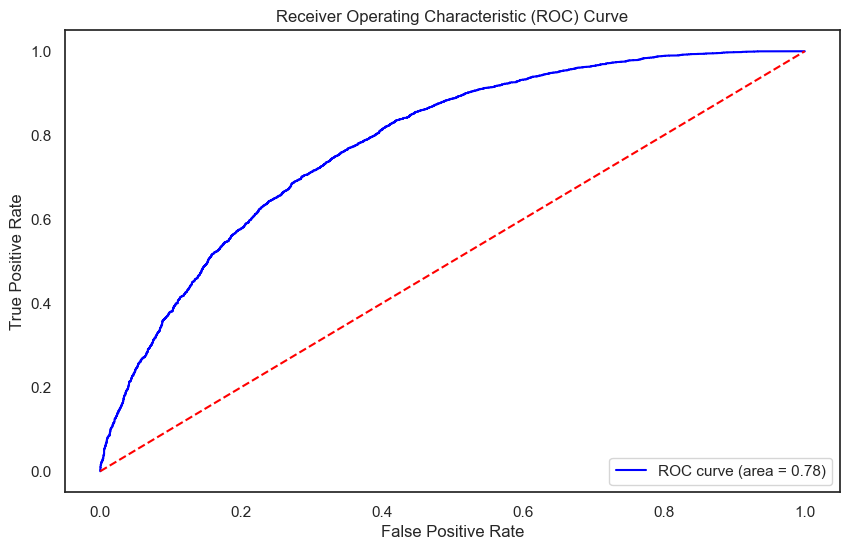

ROC AUC Score: 0.78


In [424]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Predict probabilities
y_pred_prob = gbm.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [425]:
R5=round(roc_auc,2)

### 6. XGBoost Classifier

In [427]:
## model creation
from xgboost import XGBClassifier#importing the model library
xgb_r=XGBClassifier(random_state=42,n_jobs=1) ## object creation
xgb_r.fit(X_train,y_train)# fitting the data

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=1, num_parallel_tree=1, predictor='auto', random_state=42,
              reg_alpha=0, reg_lambda=1, ...)

In [428]:
y_pred6=xgb_r.predict(X_test) 

In [429]:
y_train_pred6 = xgb_r.predict(X_train)

#### Accuracy of testing data

In [431]:
pd.crosstab(y_test,y_pred6)

col_0,0,1
Bad_label,,
0,3867,706
1,226,4358


In [432]:
a6=accuracy_score(y_test,y_pred6)
a6

0.8982199410287212

In [433]:
f6=round(f1_score(y_test,y_pred6),2)
f6

0.9

In [434]:
print(classification_report(y_test,y_pred6))

              precision    recall  f1-score   support

           0       0.94      0.85      0.89      4573
           1       0.86      0.95      0.90      4584

    accuracy                           0.90      9157
   macro avg       0.90      0.90      0.90      9157
weighted avg       0.90      0.90      0.90      9157



#### Accuracy of training data

In [436]:
a_6=accuracy_score(y_train,y_train_pred6)
a_6

0.9492996969448767

In [437]:
f_6=f1_score(y_train,y_train_pred6)
f_6

0.9511328649246072

#### Cross Validation

In [439]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(xgb_r,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())

[0.89042264 0.89172173 0.88285071]
Cross validation Score: 0.8883316934655098
Std : 0.003911758762308176


In [440]:
c6=round(scores.mean(),2)

#### ROC AUC Curve

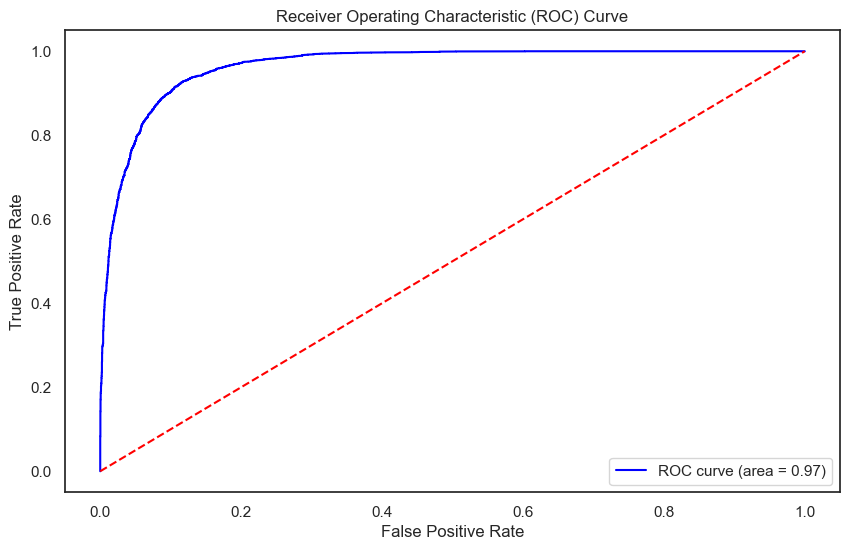

ROC AUC Score: 0.97


In [442]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Predict probabilities
y_pred_prob = xgb_r.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [443]:
R6=round(roc_auc,2)

### 7. ANN

In [445]:
from sklearn.neural_network import MLPClassifier
model=MLPClassifier(hidden_layer_sizes=(50,3),
                    learning_rate_init=0.01,
                    max_iter=100,
                    random_state=2)
model.fit(X_train,y_train)

MLPClassifier(hidden_layer_sizes=(50, 3), learning_rate_init=0.01, max_iter=100,
              random_state=2)

In [446]:
y_pred7=model.predict(X_test)

In [447]:
y_train_pred7=model.predict(X_train)

#### Accuracy of testing data

In [449]:
pd.crosstab(y_test,y_pred7)

col_0,0,1
Bad_label,,
0,3588,985
1,555,4029


In [450]:
a7=accuracy_score(y_test,y_pred7)
a7

0.8318226493393033

In [451]:
f7=round(f1_score(y_test,y_pred7),2)
f7

0.84

In [452]:
print(classification_report(y_test,y_pred7))

              precision    recall  f1-score   support

           0       0.87      0.78      0.82      4573
           1       0.80      0.88      0.84      4584

    accuracy                           0.83      9157
   macro avg       0.83      0.83      0.83      9157
weighted avg       0.83      0.83      0.83      9157



#### Accuracy of training data

In [454]:
a_7=accuracy_score(y_train,y_train_pred7)
a_7

0.8563900947388539

In [455]:
f_7=f1_score(y_test,y_pred7)
f_7

0.8395499062304647

#### Cross Validation

In [457]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(model,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())

[0.83193837 0.82904018 0.83023791]
Cross validation Score: 0.8304054904412256
Std : 0.0011891003944373953


In [458]:
c7=round(scores.mean(),2)

#### ROC AUC Curve

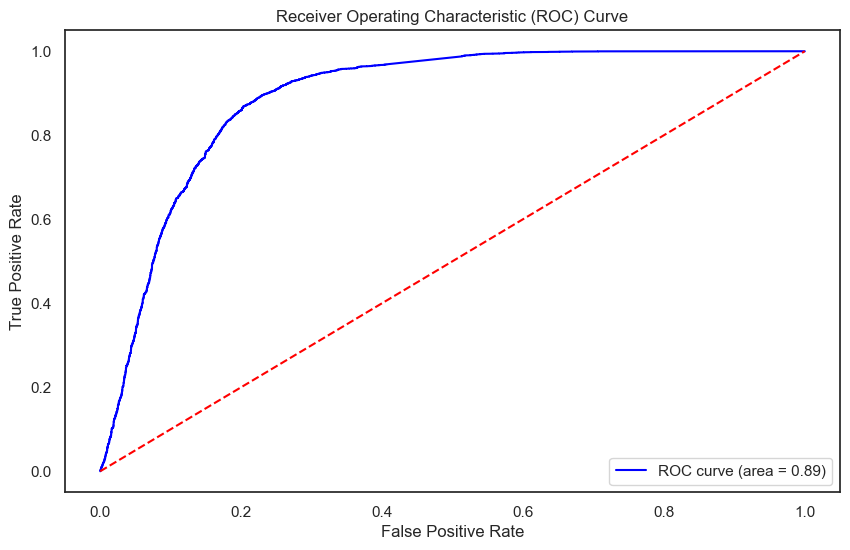

ROC AUC Score: 0.89


In [460]:
# Predict probabilities
y_pred_prob =model.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [461]:
R7=round(roc_auc,2)

### 8. Naive Bayes

In [463]:
## Model creation
from sklearn.naive_bayes import BernoulliNB

## model object creation
nb=BernoulliNB(alpha=0.01) 

## fitting the model
nb.fit(X_train,y_train)

BernoulliNB(alpha=0.01)

In [464]:
y_pred8=nb.predict(X_test)

In [465]:
y_train_pred8=nb.predict(X_train)

#### Accuracy of testing data

In [467]:
a8=accuracy_score(y_test,y_pred8)
a8

0.589603581959157

In [468]:
f8=round(f1_score(y_test,y_pred8),2)
f8

0.59

#### Accuracy of training data

In [470]:
a_8=accuracy_score(y_train,y_train_pred8)
a_8

0.5840227154831136

In [471]:
f_8=f1_score(y_train,y_train_pred8)
f_8

0.5846690655326573

#### Cross Validation

In [473]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(nb,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())

[0.58398184 0.57831129 0.5890411 ]
Cross validation Score: 0.583778074324003
Std : 0.004382795881549636


In [474]:
c8=round(scores.mean(),2)

#### ROC AUC Curve

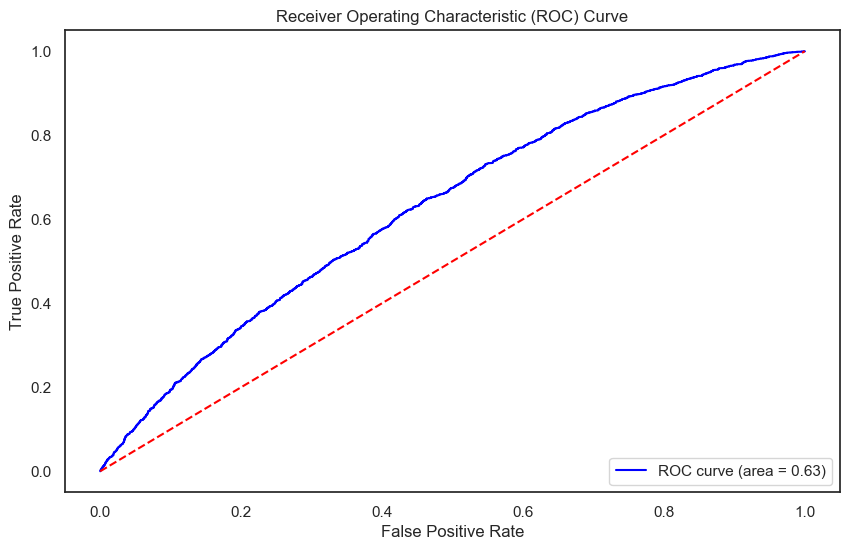

ROC AUC Score: 0.63


In [476]:
from sklearn.metrics import roc_curve, roc_auc_score, auc

# Predict probabilities
y_pred_prob =nb.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [477]:
R8=round(roc_auc,2)

### 9. K-Nearest Neighbor

In [479]:
from sklearn.neighbors import KNeighborsClassifier

In [480]:
## taking optimal k to determine how many nearest neighbors  to create

# create a list to store the error values for each k
error_rate = []

# Will take some time
for i in range(1,11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

In [481]:
error_rate

[0.0763350442284591,
 0.06519602489898438,
 0.11488478759419024,
 0.09915911324669652,
 0.1343234683848422,
 0.12187397619307634,
 0.15157802773834225,
 0.14000218412143714,
 0.1690509992355575,
 0.15605547668450365]

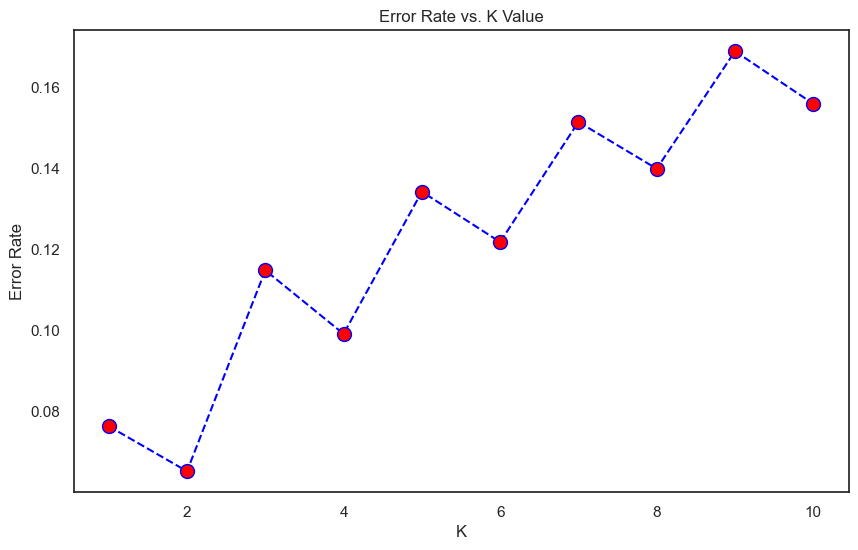

In [482]:
# Lets plot the k-value and error rate

plt.figure(figsize=(10,6))
plt.plot(range(1,11),error_rate,color='blue', linestyle='dashed', 
         marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.show()

In [483]:
# let's fit the data into KNN model and see how well it performs:
knn1 = KNeighborsClassifier(n_neighbors=3)
knn1.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [484]:
y_pred9=knn1.predict(X_test)

In [485]:
y_train_pred9=knn1.predict(X_train)

#### Accuracy of testing data

In [487]:
pd.crosstab(y_test,y_pred9)

col_0,0,1
Bad_label,,
0,3521,1052
1,0,4584


In [488]:
a9=accuracy_score(y_test,y_pred9)
a9

0.8851152124058098

In [489]:
f9=round(f1_score(y_test,y_pred9),2)
f9

0.9

In [490]:
print(classification_report(y_test,y_pred9))

              precision    recall  f1-score   support

           0       1.00      0.77      0.87      4573
           1       0.81      1.00      0.90      4584

    accuracy                           0.89      9157
   macro avg       0.91      0.88      0.88      9157
weighted avg       0.91      0.89      0.88      9157



#### Accuracy of training data

In [492]:
a_9=accuracy_score(y_train,y_train_pred9)
a_9

0.9366314467469353

In [493]:
f_9=f1_score(y_test,y_pred9)
f_9

0.8970645792563601

#### Cross Validation

In [495]:
## checking cross validation score
from sklearn.model_selection import cross_val_score
scores = cross_val_score(knn1,X_train,y_train,cv=3,scoring='f1')
print(scores)
print("Cross validation Score:",scores.mean())
print("Std :",scores.std())

[0.8818727  0.88193642 0.88653204]
Cross validation Score: 0.883447049564697
Std : 0.0021815695366025466


In [496]:
c9=round(scores.mean(),2)

#### ROC AUC Curve

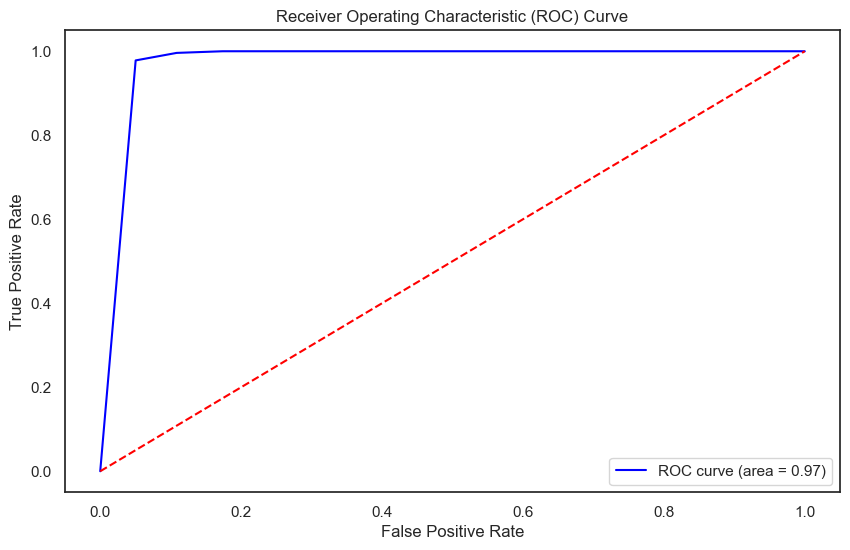

ROC AUC Score: 0.97


In [498]:
# Predict probabilities
y_pred_prob =knn.predict_proba(X_test)[:, 1]

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)

# Calculate AUC
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

print(f'ROC AUC Score: {roc_auc:.2f}')

In [499]:
R9=round(roc_auc,2)

### Conclusion

### Model Performance Summary

The table below summarizes the performance metrics of different machine learning models evaluated during the project:

In [503]:
model_name= ['Logistic Regression', 'Decision Tree Classifier', 'Random Forest Classifier','Bagging Classifier','Boosting Classifier','XGBoost Classifier','ANN','Naive Bayes','K-Nearest Neighbor'] 
f1_score= [f1,f2,f3,f4,f5,f6,f7,f8,f9]
cross_validation_score = [c1,c2,c3,c4,c5,c6,c7,c8,c9]
roc_auc_score = [R1,R2,R3,R4,R5,R6,R7,R8,R9]
dict={'Model Name':model_name , 'F1 Score':f1_score, 'Cross_Validation_Score': cross_validation_score , 'ROC AUC Score':roc_auc_score}

In [504]:
data_frame = pd.DataFrame(dict)
data_frame

,Model Name,F1 Score,Cross_Validation_Score,ROC AUC Score
0,Logistic Regression,0.62,0.62,0.65
1,Decision Tree Classifier,0.86,0.84,0.85
2,Random Forest Classifier,0.97,0.96,1.00
3,Bagging Classifier,0.94,0.92,0.98
4,Boosting Classifier,0.73,0.72,0.78
5,XGBoost Classifier,0.90,0.89,0.97
6,ANN,0.84,0.83,0.89
7,Naive Bayes,0.59,0.58,0.63
8,K-Nearest Neighbor,0.90,0.88,0.97


In [505]:
gini_scores = 2 * data_frame['ROC AUC Score'] - 1
data_frame['Gini Score'] = gini_scores
data_frame

,Model Name,F1 Score,Cross_Validation_Score,ROC AUC Score,Gini Score
0,Logistic Regression,0.62,0.62,0.65,0.30
1,Decision Tree Classifier,0.86,0.84,0.85,0.70
2,Random Forest Classifier,0.97,0.96,1.00,1.00
3,Bagging Classifier,0.94,0.92,0.98,0.96
4,Boosting Classifier,0.73,0.72,0.78,0.56
5,XGBoost Classifier,0.90,0.89,0.97,0.94
6,ANN,0.84,0.83,0.89,0.78
7,Naive Bayes,0.59,0.58,0.63,0.26
8,K-Nearest Neighbor,0.90,0.88,0.97,0.94


**Final Model Selection**

Based on the model evaluation, we need to select a model that balances predictive performance and generalizability while avoiding overfitting.

**Key Considerations:**

* Random Forest Classifier achieved an AUC-ROC of 1.00, which is highly suspicious and suggests overfitting or data leakage. Hence, it is not selected as the final model.

* XGBoost Classifier and Bagging Classifier both performed well, with Gini scores of 0.94 and 0.96, respectively. These models are robust and generalizable, making them strong candidates.

* Decision Tree Classifier had a Gini score of 0.70, indicating good performance but not as strong as XGBoost or Bagging.

* ANN (Artificial Neural Network) performed decently with a Gini score of 0.78, but it was outperformed by tree-based models.

* Logistic Regression and Naïve Bayes had the lowest scores and were not suitable for this problem.

**Final Model Choice:**
Considering the balance between performance and generalizability, we select the Bagging Classifier or XGBoost Classifier as the final model.

* Bagging Classifier (Gini = 0.96) is a stable model that reduces variance and avoids overfitting.
  
* XGBoost Classifier (Gini = 0.94) is also highly efficient and can handle complex relationships well.

Since both models performed similarly, we recommend Bagging Classifier as the final model due to its high performance and lower risk of overfitting compared to boosting techniques.

**Credit Score Prediction Report**

**1. Introduction**

Objective: Bank GoodCredit aims to predict the credit score of current credit card customers. The goal is to assess customer creditworthiness and mitigate default risk.

Target Variable: Bad_label

0 → Customer has a good credit history

1 → Customer has a bad credit history (falls into the 30 DPD+ bucket)

The benchmark model had a Gini score of 37.9, which served as a reference for model performance.

**2. Challenges Faced**

* 1 Data Quality Issues

Missing Values: Several columns had missing values, requiring appropriate handling strategies (e.g., imputation or removal).

Outliers: Features such as enq_amt and count_enquiry_recency_365 had extreme values that needed outlier treatment.

* 2 Feature Selection & Engineering

  * High-Dimensional Data: The dataset contained multiple features, and selecting the most relevant ones was critical.

  * Feature Importance Confusion:

      *Initially, all features were considered, but this led to overfitting.
      * Using feature importance scores from Random Forest helped prioritize relevant variables.
      * Recursive Feature Elimination (RFE) was considered 

* 3 Computational Challenges

  * Cross-Validation (CV) Time Complexity:

    * CV for selecting features was extremely time-consuming.
    * Instead of exhaustive CV, a threshold-based feature selection approach was adopted        (e.g., importance > 0.03).

* 4 Model Performance Constraints

  * Benchmark Model Comparison: Achieving a higher Gini score than 37.9 required extensive tuning.

  * Balancing Model Complexity & Interpretability:
    * Random Forest provided good accuracy but was complex to interpret.
    * Simpler models like Logistic Regression lacked predictive power.

**3. Techniques Used**

* 1 Data Preprocessing

  * Handling Missing Values: Used mean/median imputation for continuous features and mode imputation for categorical features.

  * Outlier Treatment:
 Displayed outliers using boxplot and handle them using IQR method.

  * Feature Engineering:
    * Created new variables (e.g., Ratio_currbalance_creditlimit).
    * Transformed categorical features into numerical format using one-hot encoding or label encoding.

  * Scaling: Standardized continuous variables to improve model stability.

* 2 Feature Selection

  * Random Forest Feature Importance: Identified the top 20 most important features.

  * Threshold-Based Selection: Only included features with importance > 0.03 to reduce overfitting.

  * Recursive Feature Elimination (RFE): Performed to validate the best subset of features.